# Loadings and Initialisations

In [ ]:
import numpy as np
import pandas as pd

import sys
import os

# Absolute path to the utils directory
utils_path = os.path.abspath(r".\utils")

# Add it to sys.path
if utils_path not in sys.path:
    sys.path.append(utils_path)

In [2]:
# Necessary to not clog the output for pdf
import warnings
from scipy.sparse import SparseEfficiencyWarning

warnings.filterwarnings("ignore", category=UserWarning)
warnings.filterwarnings("ignore", category=RuntimeWarning)
warnings.filterwarnings("ignore", category=FutureWarning)
warnings.filterwarnings("ignore", category=SparseEfficiencyWarning)

In [ ]:
# Loading the views

# Load all sheets from the Excel file
xls_path = r"..\Datasets\Final Datasets\subnationalindicatorsdataset.xlsx"
all_views = pd.read_excel(xls_path, sheet_name=None)

# Convert sheet names to lowercase keys and assign to variables
views = {}
for sheet_name, df in all_views.items():
    key = sheet_name.lower()
    views[key] = df
    globals()[f"{key}_df"] = df

# Remove the 'spatial' view if it exists
views.pop("spatial", None)

print(views)

{'economic':      Area Code         Area Level                  Area  \
0    E06000001  Unitary Authority            Hartlepool   
1    E06000002  Unitary Authority         Middlesbrough   
2    E06000003  Unitary Authority  Redcar and Cleveland   
3    E06000004  Unitary Authority      Stockton-on-Tees   
4    E06000005  Unitary Authority            Darlington   
..         ...                ...                   ...   
304  E09000029     London Borough                Sutton   
305  E09000030     London Borough         Tower Hamlets   
306  E09000031     London Borough        Waltham Forest   
307  E09000032     London Borough            Wandsworth   
308  E09000033     London Borough           Westminster   

     Gross Value Added (GVA) per hour worked (£) Gross median weekly pay (£)  \
0                                          31.85                       487.4   
1                                          30.96                       420.8   
2                                     

In [4]:
# Constants
META_COLS = [
    "Local_Authority_Name", "Local Authority Name", 
    "Area", "Area Level", "Area Code", 
    "Local_Authority_Code"
]

# Exclusions for each view based on ONS guidelines
ONS_EXCLUSIONS = {
    'economic': ['E06000053', 'E09000001'],
    'connectivity': ['E06000053', 'E06000057', 'E06000058', 'E06000059',
                     'E06000060', 'E06000061', 'E06000062', 'E08000037'],
    'educational_attainment': ['E06000017', 'E06000053', 'E06000060',
                                'E06000061', 'E06000062', 'E09000001'],
    'skills': ['E06000053', 'E07000166', 'E09000001'],
    'health': ['E06000022', 'E06000049', 'E06000050', 'E06000053', 'E06000060',
               'E06000061', 'E06000062', 'E07000234', 'E07000236', 'E07000237',
               'E07000238', 'E07000239', 'E08000001', 'E08000002', 'E09000001',
               'E09000010', 'E09000025', 'E09000032'],
    'wellbeing': ['E06000053', 'E09000001']
} 

# Known optimal number of clusters per view (ONS-determined)
ONS_K_VALUES = {
    'economic': 4,
    'connectivity': 4,
    'educational_attainment': 8,
    'skills': 4,
    'health': 4,
    'wellbeing': 4
}

# Overview

| Strategy         | Distance-based                                                                              | Factorization-based                       | Autoencoder/Deep-based                      |
| ---------------- | ------------------------------------------------------------------------------------------- | ----------------------------------------- | ------------------------------------------- |
| **Early**        | Masked Cosine                                                                  | Masked Tri-Factorization                | Masked Autoencoder                        |
| **Intermediate** | Multi-view Similarity Fusion (MVSF) | Per-view NMF or NMTF → concat $G^{(v)}$ | Multi-branch Encoder (shared latent)      |
| **Late**         | Cluster Co-association (ensemble)                                                         | Collective Matrix Factorization         | Ensemble of per-view AEs + cluster voting |


## Similarity-based Methods

### Early - Masked Cosine Similarity (MCS)

In [ ]:
from similarity_based_methods import run_early_mcs_pca_kmeans

# Run the early integration masked cosine similarity PCA + KMeans
MCS_out = run_early_mcs_pca_kmeans(
    views=views,
    k_range=range(4, 16),
    n_pca_range=range(2, 6),
    n_init=100,               
    normalize_rows=True,
    zero_diagonal=True,
    verbose=True
)

# Unpack results
MCS_S = MCS_out["S"]
area_codes = MCS_out["area_codes"]
MCS_labels = MCS_out["labels"]
MCS_embedding = MCS_out["embedding"]
MCS_sil = MCS_out["silhouette"]
MCS_best_params = MCS_out["best_params"]
MCS_assign_df = MCS_out["assignments_df"]
MCS_grid_results = MCS_out["grid_results"]

print("Best params (n_pca, k):", MCS_best_params)
print("Best silhouette:", MCS_sil)
display(MCS_assign_df.head())
display(MCS_grid_results.head())

  File "c:\Users\maxim\AppData\Local\Programs\Python\Python310\lib\site-packages\joblib\externals\loky\backend\context.py", line 257, in _count_physical_cores
    cpu_info = subprocess.run(
  File "c:\Users\maxim\AppData\Local\Programs\Python\Python310\lib\subprocess.py", line 503, in run
    with Popen(*popenargs, **kwargs) as process:
  File "c:\Users\maxim\AppData\Local\Programs\Python\Python310\lib\subprocess.py", line 971, in __init__
    self._execute_child(args, executable, preexec_fn, close_fds,
  File "c:\Users\maxim\AppData\Local\Programs\Python\Python310\lib\subprocess.py", line 1456, in _execute_child
    hp, ht, pid, tid = _winapi.CreateProcess(executable, args,


n=309, PCA=2, K=4 → Silhouette: 0.5431
n=309, PCA=2, K=5 → Silhouette: 0.4527
n=309, PCA=2, K=6 → Silhouette: 0.4501
n=309, PCA=2, K=7 → Silhouette: 0.4429
n=309, PCA=2, K=8 → Silhouette: 0.4335
n=309, PCA=2, K=9 → Silhouette: 0.4223
n=309, PCA=2, K=10 → Silhouette: 0.4009
n=309, PCA=2, K=11 → Silhouette: 0.4075
n=309, PCA=2, K=12 → Silhouette: 0.4019
n=309, PCA=2, K=13 → Silhouette: 0.3963
n=309, PCA=2, K=14 → Silhouette: 0.4056
n=309, PCA=2, K=15 → Silhouette: 0.3948
n=309, PCA=3, K=4 → Silhouette: 0.5427
n=309, PCA=3, K=5 → Silhouette: 0.4529
n=309, PCA=3, K=6 → Silhouette: 0.4499
n=309, PCA=3, K=7 → Silhouette: 0.4425
n=309, PCA=3, K=8 → Silhouette: 0.4335
n=309, PCA=3, K=9 → Silhouette: 0.4223
n=309, PCA=3, K=10 → Silhouette: 0.4042
n=309, PCA=3, K=11 → Silhouette: 0.3955
n=309, PCA=3, K=12 → Silhouette: 0.4006
n=309, PCA=3, K=13 → Silhouette: 0.4009
n=309, PCA=3, K=14 → Silhouette: 0.3999
n=309, PCA=3, K=15 → Silhouette: 0.3973
n=309, PCA=4, K=4 → Silhouette: 0.5427
n=309, PCA=4,

,Local_Authority_Code,Cluster
0,E06000001,3
1,E06000002,3
2,E06000003,3
3,E06000004,3
4,E06000005,3


,PCA_n_components,K,Silhouette
0,2,4,0.543144
1,2,5,0.452725
2,2,6,0.450139
3,2,7,0.442884
4,2,8,0.433503


### Intermediate - Multi-View Similarity Fusion (MVSF)

In [ ]:
from similarity_based_methods import run_mvsf_pca_kmeans

MVSF_out = run_mvsf_pca_kmeans(
    views=views,
    k_range=range(4, 16),
    n_pca_range=range(2, 6),
    n_init=100,
    normalize_rows=True,
    zero_diagonal=True,
    verbose=True
)

# Unpack
MVSF_S_fused = MVSF_out["S_fused"]
area_codes = MVSF_out["area_codes"]
MVSF_similarity_matrices = MVSF_out["similarity_matrices"]
MVSF_view_names = MVSF_out["view_names"]
MVSF_labels = MVSF_out["labels"]
MVSF_best_params = MVSF_out["best_params"]
MVSF_per_view_contributions = MVSF_out["per_view_contributions_per_la"]
MVSF_embedding = MVSF_out["embedding"]

# Handy assignments and grid search history:
MVSF_assignments_df = MVSF_out["assignments_df"] # LA code → cluster
MVSF_grid_results = MVSF_out["grid_results"] # (PCA_n_components, K, Silhouette)
display(MVSF_assignments_df.head())
display(MVSF_grid_results.head())

n=309, PCA=2, K=4 → Silhouette: 0.9794
n=309, PCA=2, K=5 → Silhouette: 0.7606
n=309, PCA=2, K=6 → Silhouette: 0.7016
n=309, PCA=2, K=7 → Silhouette: 0.6790
n=309, PCA=2, K=8 → Silhouette: 0.6401
n=309, PCA=2, K=9 → Silhouette: 0.5887
n=309, PCA=2, K=10 → Silhouette: 0.6075
n=309, PCA=2, K=11 → Silhouette: 0.6303
n=309, PCA=2, K=12 → Silhouette: 0.5969
n=309, PCA=2, K=13 → Silhouette: 0.5946
n=309, PCA=2, K=14 → Silhouette: 0.5805
n=309, PCA=2, K=15 → Silhouette: 0.5832
n=309, PCA=3, K=4 → Silhouette: 0.9557
n=309, PCA=3, K=5 → Silhouette: 0.9557
n=309, PCA=3, K=6 → Silhouette: 0.9634
n=309, PCA=3, K=7 → Silhouette: 0.9343
n=309, PCA=3, K=8 → Silhouette: 0.7507
n=309, PCA=3, K=9 → Silhouette: 0.7417
n=309, PCA=3, K=10 → Silhouette: 0.7469
n=309, PCA=3, K=11 → Silhouette: 0.6439
n=309, PCA=3, K=12 → Silhouette: 0.6137
n=309, PCA=3, K=13 → Silhouette: 0.6418
n=309, PCA=3, K=14 → Silhouette: 0.6371
n=309, PCA=3, K=15 → Silhouette: 0.6003
n=309, PCA=4, K=4 → Silhouette: 0.9344
n=309, PCA=4,

,Local_Authority_Code,Cluster
0,E06000001,1
1,E06000002,1
2,E06000003,1
3,E06000004,1
4,E06000005,1


,PCA_n_components,K,Silhouette
0,2,4,0.979377
1,2,5,0.760631
2,2,6,0.701628
3,2,7,0.679041
4,2,8,0.640112


### Late - Co-association Similarity Ensemble (CSE)

In [ ]:
from similarity_based_methods import run_late_coassoc_pca_kmeans

CSE_out = run_late_coassoc_pca_kmeans(
    views=views,
    ons_k_values=ONS_K_VALUES,
    k_range=range(4, 16),
    n_pca_range=range(2, 6),
    n_init=100,
    verbose=True
)

# Unpack for reporting/plots
CSE_S= CSE_out["S_coassoc"]
area_codes= CSE_out["area_codes"]
CSE_labels = CSE_out["labels"]
CSE_embedding = CSE_out["embedding"]
CSE_assign_df = CSE_out["assignments_df"]
CSE_grid_res = CSE_out["grid_results"]
CSE_clusterings = CSE_out["clusterings"]  # per-view labelings if you want to inspect them

print("Best (n_pca, k):", CSE_out["best_params"])
print("Best silhouette:", CSE_out["silhouette"])
display(CSE_assign_df.head())
display(CSE_grid_res.head())

n=309, PCA=2, K=4 → Silhouette: 0.4877
n=309, PCA=2, K=5 → Silhouette: 0.5207
n=309, PCA=2, K=6 → Silhouette: 0.5085
n=309, PCA=2, K=7 → Silhouette: 0.5129
n=309, PCA=2, K=8 → Silhouette: 0.5252
n=309, PCA=2, K=9 → Silhouette: 0.5174
n=309, PCA=2, K=10 → Silhouette: 0.4897
n=309, PCA=2, K=11 → Silhouette: 0.4960
n=309, PCA=2, K=12 → Silhouette: 0.5027
n=309, PCA=2, K=13 → Silhouette: 0.5088
n=309, PCA=2, K=14 → Silhouette: 0.5049
n=309, PCA=2, K=15 → Silhouette: 0.4747
n=309, PCA=3, K=4 → Silhouette: 0.4022
n=309, PCA=3, K=5 → Silhouette: 0.3857
n=309, PCA=3, K=6 → Silhouette: 0.4023
n=309, PCA=3, K=7 → Silhouette: 0.4441
n=309, PCA=3, K=8 → Silhouette: 0.4952
n=309, PCA=3, K=9 → Silhouette: 0.5152
n=309, PCA=3, K=10 → Silhouette: 0.5483
n=309, PCA=3, K=11 → Silhouette: 0.5747
n=309, PCA=3, K=12 → Silhouette: 0.5808
n=309, PCA=3, K=13 → Silhouette: 0.5915
n=309, PCA=3, K=14 → Silhouette: 0.6029
n=309, PCA=3, K=15 → Silhouette: 0.5902
n=309, PCA=4, K=4 → Silhouette: 0.3604
n=309, PCA=4,

,Local_Authority_Code,Cluster
0,E06000001,12
1,E06000002,6
2,E06000003,6
3,E06000004,6
4,E06000005,9


,PCA_n_components,K,Silhouette
0,2,4,0.487696
1,2,5,0.520656
2,2,6,0.508477
3,2,7,0.512922
4,2,8,0.525202


## Factorisation-based Methods

### Early - Masked Non-Negative Matrix Factorisation (MNMF)

In [ ]:
from matrix_factorisation_based_methods import run_early_mmf_pca_kmeans

MNMF_out = run_early_mmf_pca_kmeans(
    views=views,
    rank_range=range(2, 6),
    n_pca_range=range(2, 6),
    k_range=range(4, 16),
    n_init=100,
    verbose=True
)

# Unpack for reporting/plots
area_codes= MNMF_out["area_codes"]
MNMF_labels = MNMF_out["labels"]
MNMF_embedding = MNMF_out["embedding"]
MNMF_assign_df = MNMF_out["assignments_df"]
MNMF_grid_res = MNMF_out["grid_results"]

display(MNMF_assign_df.head())
display(MNMF_grid_res.head())

n=309, Rank=2, PCA=2, K=4 → Silhouette=0.3666
n=309, Rank=2, PCA=2, K=5 → Silhouette=0.3516
n=309, Rank=2, PCA=2, K=6 → Silhouette=0.3741
n=309, Rank=2, PCA=2, K=7 → Silhouette=0.3543
n=309, Rank=2, PCA=2, K=8 → Silhouette=0.3759
n=309, Rank=2, PCA=2, K=9 → Silhouette=0.3738
n=309, Rank=2, PCA=2, K=10 → Silhouette=0.3670
n=309, Rank=2, PCA=2, K=11 → Silhouette=0.3778
n=309, Rank=2, PCA=2, K=12 → Silhouette=0.3764
n=309, Rank=2, PCA=2, K=13 → Silhouette=0.3596
n=309, Rank=2, PCA=2, K=14 → Silhouette=0.3605
n=309, Rank=2, PCA=2, K=15 → Silhouette=0.3653
Skipping Rank=2, PCA=3 (Z dim=2)
Skipping Rank=2, PCA=4 (Z dim=2)
Skipping Rank=2, PCA=5 (Z dim=2)
n=309, Rank=3, PCA=2, K=4 → Silhouette=0.3243
n=309, Rank=3, PCA=2, K=5 → Silhouette=0.3364
n=309, Rank=3, PCA=2, K=6 → Silhouette=0.3539
n=309, Rank=3, PCA=2, K=7 → Silhouette=0.3454
n=309, Rank=3, PCA=2, K=8 → Silhouette=0.3631
n=309, Rank=3, PCA=2, K=9 → Silhouette=0.3719
n=309, Rank=3, PCA=2, K=10 → Silhouette=0.3828
n=309, Rank=3, PCA=2

,Local_Authority_Code,Cluster
0,E06000001,2
1,E06000002,1
2,E06000003,3
3,E06000004,3
4,E06000005,1


,PCA_n_components,K,Silhouette,Rank
0,2,4,0.366573,2
1,2,5,0.352390,4
2,2,6,0.374095,2
3,2,7,0.360451,4
4,2,8,0.375945,2


### Intermediate - Per-View NMF + concatenated G matrices (PVNMF)

In [ ]:
from matrix_factorisation_based_methods import run_intermediate_pvnmf_pca_kmeans

PVNMF_out = run_intermediate_pvnmf_pca_kmeans(
    views=views,
    rank_range=range(2, 6),
    n_pca_range=range(2, 6),
    k_range=range(4, 16),
    n_init=100,
    verbose=True
)

# Unpack for reporting/plots
area_codes= PVNMF_out["area_codes"]
PVNMF_labels  = PVNMF_out["labels"]
PVNMF_embedding = PVNMF_out["embedding"]
PVNMF_assign_df= PVNMF_out["assignments_df"]
PVNMF_grid_res = PVNMF_out["grid_results"]

display(PVNMF_assign_df.head())
display(PVNMF_grid_res.head())

n=309, PVNMF Rank=2, PCA=2, K=4 → Silhouette=0.6783
n=309, PVNMF Rank=2, PCA=2, K=5 → Silhouette=0.6744
n=309, PVNMF Rank=2, PCA=2, K=6 → Silhouette=0.6475
n=309, PVNMF Rank=2, PCA=2, K=7 → Silhouette=0.6521
n=309, PVNMF Rank=2, PCA=2, K=8 → Silhouette=0.6388
n=309, PVNMF Rank=2, PCA=2, K=9 → Silhouette=0.5730
n=309, PVNMF Rank=2, PCA=2, K=10 → Silhouette=0.5527
n=309, PVNMF Rank=2, PCA=2, K=11 → Silhouette=0.5285
n=309, PVNMF Rank=2, PCA=2, K=12 → Silhouette=0.5239
n=309, PVNMF Rank=2, PCA=2, K=13 → Silhouette=0.5265
n=309, PVNMF Rank=2, PCA=2, K=14 → Silhouette=0.5077
n=309, PVNMF Rank=2, PCA=2, K=15 → Silhouette=0.5175
n=309, PVNMF Rank=2, PCA=3, K=4 → Silhouette=0.6318
n=309, PVNMF Rank=2, PCA=3, K=5 → Silhouette=0.5646
n=309, PVNMF Rank=2, PCA=3, K=6 → Silhouette=0.5720
n=309, PVNMF Rank=2, PCA=3, K=7 → Silhouette=0.5587
n=309, PVNMF Rank=2, PCA=3, K=8 → Silhouette=0.5574
n=309, PVNMF Rank=2, PCA=3, K=9 → Silhouette=0.5644
n=309, PVNMF Rank=2, PCA=3, K=10 → Silhouette=0.5295
n=309

,Local_Authority_Code,Cluster
0,E06000001,1
1,E06000002,3
2,E06000003,3
3,E06000004,3
4,E06000005,3


,PCA_n_components,K,Silhouette,Rank
0,2,4,0.678255,2
1,2,5,0.674442,2
2,2,6,0.647468,2
3,2,7,0.652068,2
4,2,8,0.638758,2


### Late - Co-association Factorization Ensemble (CFE)

In [ ]:
from matrix_factorisation_based_methods import run_late_nmf_coassoc_pca_kmeans

CFE_out = run_late_nmf_coassoc_pca_kmeans(
    views=views,
    rank_range=range(2, 6),
    n_pca_range=range(2, 6),
    k_range=range(4, 16),
    n_init=100,
    verbose=True
)

# Unpack for reporting/plots
area_codes= CFE_out["area_codes"]
CFE_labels = CFE_out["labels"]
CFE_embedding= CFE_out["embedding"]
CFE_assign_df = CFE_out["assignments_df"]
CFE_grid_res = CFE_out["grid_results"]

display(CFE_assign_df.head())
display(CFE_grid_res.head())

n=309, LATE-NMF Rank=2, PCA=2, K=4 → Silhouette=0.6155
n=309, LATE-NMF Rank=2, PCA=2, K=5 → Silhouette=0.6767
n=309, LATE-NMF Rank=2, PCA=2, K=6 → Silhouette=0.7066
n=309, LATE-NMF Rank=2, PCA=2, K=7 → Silhouette=0.7369
n=309, LATE-NMF Rank=2, PCA=2, K=8 → Silhouette=0.7484
n=309, LATE-NMF Rank=2, PCA=2, K=9 → Silhouette=0.7535
n=309, LATE-NMF Rank=2, PCA=2, K=10 → Silhouette=0.7683
n=309, LATE-NMF Rank=2, PCA=2, K=11 → Silhouette=0.7621
n=309, LATE-NMF Rank=2, PCA=2, K=12 → Silhouette=0.7746
n=309, LATE-NMF Rank=2, PCA=2, K=13 → Silhouette=0.7132
n=309, LATE-NMF Rank=2, PCA=2, K=14 → Silhouette=0.7201
n=309, LATE-NMF Rank=2, PCA=2, K=15 → Silhouette=0.7320
n=309, LATE-NMF Rank=2, PCA=3, K=4 → Silhouette=0.5475
n=309, LATE-NMF Rank=2, PCA=3, K=5 → Silhouette=0.6249
n=309, LATE-NMF Rank=2, PCA=3, K=6 → Silhouette=0.7006
n=309, LATE-NMF Rank=2, PCA=3, K=7 → Silhouette=0.7636
n=309, LATE-NMF Rank=2, PCA=3, K=8 → Silhouette=0.7980
n=309, LATE-NMF Rank=2, PCA=3, K=9 → Silhouette=0.8115
n=30

,Local_Authority_Code,Cluster
0,E06000001,2
1,E06000002,4
2,E06000003,4
3,E06000004,2
4,E06000005,2


,PCA_n_components,K,Silhouette,Rank
0,2,4,0.615530,2
1,2,5,0.676676,2
2,2,6,0.706611,2
3,2,7,0.736878,2
4,2,8,0.748370,2


## Autoencoder-based Methods

### Early - Masked Autoencoder (MA)

In [ ]:
from autoencoder_based_methods import run_early_masked_ae_pca_kmeans

MA_out = run_early_masked_ae_pca_kmeans(
    views=views,
    latent_dim_range=[5,8,10],
    n_pca_range=range(2, 6),
    k_range=range(4, 16),
    hidden_dim = 128,
    epochs = 100,
    lr = 1e-3,
    n_init=100,
    random_state = 19042022,
    verbose=True
)

# Unpack for reporting/plots
area_codes= MA_out["area_codes"]
MA_labels = MA_out["labels"]
MA_embedding = MA_out["embedding"]
MA_assign_df= MA_out["assignments_df"]
MA_grid_res = MA_out["grid_results"]

display(MA_assign_df.head())
display(MA_grid_res.head())

[EARLY-AE] n=309, Latent=5, PCA=2, K=4 → Sil=0.6061
[EARLY-AE] n=309, Latent=5, PCA=2, K=5 → Sil=0.5062
[EARLY-AE] n=309, Latent=5, PCA=2, K=6 → Sil=0.5066
[EARLY-AE] n=309, Latent=5, PCA=2, K=7 → Sil=0.5088
[EARLY-AE] n=309, Latent=5, PCA=2, K=8 → Sil=0.5145
[EARLY-AE] n=309, Latent=5, PCA=2, K=9 → Sil=0.4161
[EARLY-AE] n=309, Latent=5, PCA=2, K=10 → Sil=0.4098
[EARLY-AE] n=309, Latent=5, PCA=2, K=11 → Sil=0.3720
[EARLY-AE] n=309, Latent=5, PCA=2, K=12 → Sil=0.3933
[EARLY-AE] n=309, Latent=5, PCA=2, K=13 → Sil=0.3981
[EARLY-AE] n=309, Latent=5, PCA=2, K=14 → Sil=0.3943
[EARLY-AE] n=309, Latent=5, PCA=2, K=15 → Sil=0.3927
[EARLY-AE] n=309, Latent=5, PCA=3, K=4 → Sil=0.5269
[EARLY-AE] n=309, Latent=5, PCA=3, K=5 → Sil=0.3695
[EARLY-AE] n=309, Latent=5, PCA=3, K=6 → Sil=0.3585
[EARLY-AE] n=309, Latent=5, PCA=3, K=7 → Sil=0.3613
[EARLY-AE] n=309, Latent=5, PCA=3, K=8 → Sil=0.3697
[EARLY-AE] n=309, Latent=5, PCA=3, K=9 → Sil=0.3739
[EARLY-AE] n=309, Latent=5, PCA=3, K=10 → Sil=0.3340
[EARL

,Local_Authority_Code,Cluster
0,E06000001,2
1,E06000002,2
2,E06000003,0
3,E06000004,2
4,E06000005,2


,PCA_n_components,K,Silhouette,Latent
0,2,4,0.606100,5
1,2,5,0.506151,5
2,2,6,0.506554,5
3,2,7,0.508841,5
4,2,8,0.514493,5


### Intermediate - Multi-Branch Autoencoder with Shared Bottleneck (MBASB)

In [ ]:
from autoencoder_based_methods import run_intermediate_multibranch_ae_pca_kmeans

MBASB_out = run_intermediate_multibranch_ae_pca_kmeans(
    views,
    latent_dim_range=[5,8,10],
    n_pca_range=range(2, 6), k_range=range(4, 16),
    epochs=100,
    n_init=100,
    verbose=True)

area_codes= MBASB_out["area_codes"]
MBASB_labels = MBASB_out["labels"]
MBASB_embedding = MBASB_out["embedding"]
MBASB_assign_df = MBASB_out["assignments_df"]
MBASB_grid_res = MBASB_out["grid_results"]

display(MBASB_assign_df.head())
display(MBASB_grid_res.head())

[MBAE] n=309, Latent=5, PCA=2, K=4 → Sil=0.5687
[MBAE] n=309, Latent=5, PCA=2, K=5 → Sil=0.4671
[MBAE] n=309, Latent=5, PCA=2, K=6 → Sil=0.4666
[MBAE] n=309, Latent=5, PCA=2, K=7 → Sil=0.4144
[MBAE] n=309, Latent=5, PCA=2, K=8 → Sil=0.4197
[MBAE] n=309, Latent=5, PCA=2, K=9 → Sil=0.4285
[MBAE] n=309, Latent=5, PCA=2, K=10 → Sil=0.4299
[MBAE] n=309, Latent=5, PCA=2, K=11 → Sil=0.3966
[MBAE] n=309, Latent=5, PCA=2, K=12 → Sil=0.4103
[MBAE] n=309, Latent=5, PCA=2, K=13 → Sil=0.4116
[MBAE] n=309, Latent=5, PCA=2, K=14 → Sil=0.3854
[MBAE] n=309, Latent=5, PCA=2, K=15 → Sil=0.3698
[MBAE] n=309, Latent=5, PCA=3, K=4 → Sil=0.5296
[MBAE] n=309, Latent=5, PCA=3, K=5 → Sil=0.4050
[MBAE] n=309, Latent=5, PCA=3, K=6 → Sil=0.4024
[MBAE] n=309, Latent=5, PCA=3, K=7 → Sil=0.4019
[MBAE] n=309, Latent=5, PCA=3, K=8 → Sil=0.3888
[MBAE] n=309, Latent=5, PCA=3, K=9 → Sil=0.3937
[MBAE] n=309, Latent=5, PCA=3, K=10 → Sil=0.3949
[MBAE] n=309, Latent=5, PCA=3, K=11 → Sil=0.3511
[MBAE] n=309, Latent=5, PCA=3, K

,Local_Authority_Code,Cluster
0,E06000001,0
1,E06000002,0
2,E06000003,0
3,E06000004,0
4,E06000005,0


,PCA_n_components,K,Silhouette,Latent
0,2,4,0.568660,5
1,2,5,0.504891,8
2,2,6,0.503319,8
3,2,7,0.419513,10
4,2,8,0.441429,8


### Late - Autoencoder Ensemble with Consensus Clustering (AECC)

In [ ]:
from autoencoder_based_methods import run_late_ae_coassoc_pca_kmeans

AECC_out = run_late_ae_coassoc_pca_kmeans(
    views, 
    latent_dim_range=[5,8,10],
    n_pca_range=range(2, 6),
    k_range=range(4, 16),
    epochs=100, 
    n_init=100, 
    verbose=True)

AECC_S = AECC_out["S_coassoc"]
area_codes= AECC_out["area_codes"]
AECC_labels = AECC_out["labels"]
AECC_embedding = AECC_out["embedding"]
AECC_assign_df = AECC_out["assignments_df"]
AECC_grid_res = AECC_out["grid_results"]
AECC_clusterings = AECC_out["clusterings"]

display(AECC_assign_df.head())
display(AECC_grid_res.head())

[AE-CFE] n=309, Latent=5, PCA=2, K=4 → Sil=0.4619
[AE-CFE] n=309, Latent=5, PCA=2, K=5 → Sil=0.4730
[AE-CFE] n=309, Latent=5, PCA=2, K=6 → Sil=0.4322
[AE-CFE] n=309, Latent=5, PCA=2, K=7 → Sil=0.3963
[AE-CFE] n=309, Latent=5, PCA=2, K=8 → Sil=0.5267
[AE-CFE] n=309, Latent=5, PCA=2, K=9 → Sil=0.4137
[AE-CFE] n=309, Latent=5, PCA=2, K=10 → Sil=0.4312
[AE-CFE] n=309, Latent=5, PCA=2, K=11 → Sil=0.4393
[AE-CFE] n=309, Latent=5, PCA=2, K=12 → Sil=0.3967
[AE-CFE] n=309, Latent=5, PCA=2, K=13 → Sil=0.3666
[AE-CFE] n=309, Latent=5, PCA=2, K=14 → Sil=0.4091
[AE-CFE] n=309, Latent=5, PCA=2, K=15 → Sil=0.3841
[AE-CFE] n=309, Latent=5, PCA=3, K=4 → Sil=0.4359
[AE-CFE] n=309, Latent=5, PCA=3, K=5 → Sil=0.4276
[AE-CFE] n=309, Latent=5, PCA=3, K=6 → Sil=0.3845
[AE-CFE] n=309, Latent=5, PCA=3, K=7 → Sil=0.4951
[AE-CFE] n=309, Latent=5, PCA=3, K=8 → Sil=0.4293
[AE-CFE] n=309, Latent=5, PCA=3, K=9 → Sil=0.4150
[AE-CFE] n=309, Latent=5, PCA=3, K=10 → Sil=0.4057
[AE-CFE] n=309, Latent=5, PCA=3, K=11 → Sil

,Local_Authority_Code,Cluster
0,E06000001,2
1,E06000002,1
2,E06000003,1
3,E06000004,2
4,E06000005,2


,PCA_n_components,K,Silhouette,Latent
0,2,4,0.543519,10
1,2,5,0.472983,5
2,2,6,0.458589,8
3,2,7,0.450519,8
4,2,8,0.565482,10


# Export Results

In [91]:
# Map each DataFrame to its strategy and model name
method_map = {
    "MCS_grid_results": ("Early Integration", "Masked Cosine Similarity (MCS))"),
    "MVSF_grid_results": ("Intermediate Integration", "Multi-View Similarity Fusion (MVSF)"),
    "CSE_grid_res": ("Late Integration", "Co-association Similarity Ensemble (CSE)"),
    "MNMF_grid_res": ("Early Integration", "Masked Non-Negative Matrix Factorization (MNMF)"),
    "PVNMF_grid_res": ("Intermediate Integration", "Per-View NMF (PVNMF)"),
    "CFE_grid_res": ("Late Integration", "Co-association Factorization Ensemble (CFE)"),
    "MA_grid_res": ("Early Integration", "Masked Autoencoder (MA)"),
    "MBASB_grid_res": ("Intermediate Integration", "Multibranch Autoencoder w/ Shared Bottleneck (MBASB)"),
    "AECC_grid_res": ("Late Integration", "Autoencoders Ensemble w/ Consensus Clustering (AECC)")
}
# Column name variants
component_variants = ["PCA_n_components"]
k_variants = ["K"]
sil_variants = ["Silhouette"]


all_results = []
for var_name, (strategy, model) in method_map.items():
    df = globals()[var_name].copy()

    # Unify n_components
    comp_col = next((c for c in component_variants if c in df.columns), None)
    if comp_col is None:
        raise ValueError(f"No component column found in {var_name}")
    df = df.rename(columns={comp_col: "n_components"})

    # Unify k
    k_col = next((c for c in k_variants if c in df.columns), None)
    if k_col is None:
        raise ValueError(f"No k column found in {var_name}")
    df = df.rename(columns={k_col: "k"})

    # Unify Silhouette
    sil_col = next((c for c in sil_variants if c in df.columns), None)
    if sil_col is None:
        raise ValueError(f"No silhouette column found in {var_name}")
    df = df.rename(columns={sil_col: "Silhouette"})

    # Keep only required + metadata
    df = df[["n_components", "k", "Silhouette"]]
    df["Strategy"] = strategy
    df["Model"] = model
    all_results.append(df)

# Merge all results
MVL_results = pd.concat(all_results, ignore_index=True)

# Sort in logical order
strategy_order = {"Early Integration": 0, "Intermediate Integration": 1, "Late Integration": 2}
MVL_results["Strategy_order"] = MVL_results["Strategy"].map(strategy_order)
MVL_results = MVL_results.sort_values(["Strategy_order", "Model", "n_components", "k"]).drop(columns="Strategy_order").reset_index(drop=True)

display(MVL_results.head())

MVL_results.to_csv(r".\Outputs\MVL_results.csv", index=False)

,n_components,k,Silhouette,Strategy,Model
0,2,4,0.606100,Early Integration,Masked Autoencoder (MA)
1,2,5,0.506151,Early Integration,Masked Autoencoder (MA)
2,2,6,0.506554,Early Integration,Masked Autoencoder (MA)
3,2,7,0.508841,Early Integration,Masked Autoencoder (MA)
4,2,8,0.514493,Early Integration,Masked Autoencoder (MA)


# Analysis and plots

In [ ]:
MVL_results = pd.read_csv(r".\Outputs\MVL_results.csv")
display(MVL_results)

,n_components,k,Silhouette,Strategy,Model
0,2,4,0.606100,Early Integration,Masked Autoencoder (MA)
1,2,5,0.506151,Early Integration,Masked Autoencoder (MA)
2,2,6,0.506554,Early Integration,Masked Autoencoder (MA)
3,2,7,0.508841,Early Integration,Masked Autoencoder (MA)
4,2,8,0.514493,Early Integration,Masked Autoencoder (MA)
...,...,...,...,...,...
427,5,11,0.480342,Late Integration,Co-association Similarity Ensemble (CSE)
428,5,12,0.495623,Late Integration,Co-association Similarity Ensemble (CSE)
429,5,13,0.510600,Late Integration,Co-association Similarity Ensemble (CSE)
430,5,14,0.529985,Late Integration,Co-association Similarity Ensemble (CSE)


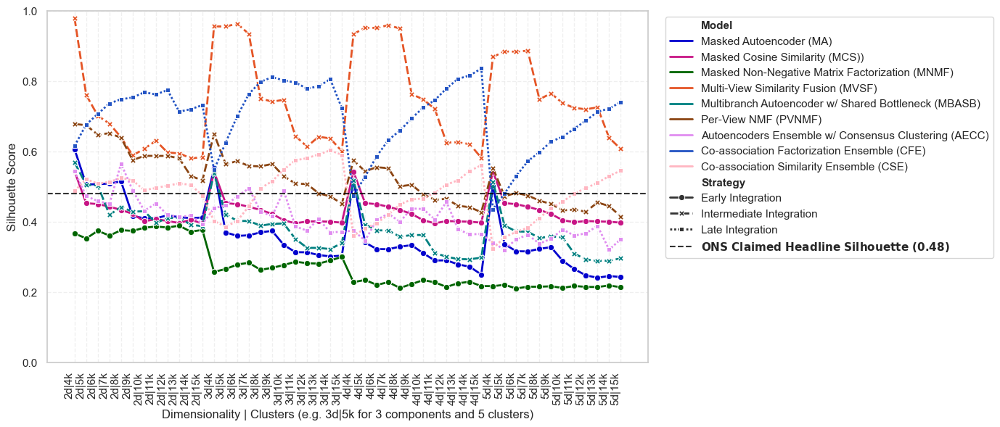

In [174]:
import seaborn as sns
import matplotlib.pyplot as plt

# Sort and create formatted x-axis labels
MVL_results_sorted = MVL_results.sort_values(
    by=['n_components', 'k'], ascending=[True, True]
).copy()

MVL_results_sorted["Dim|Clusters"] = (
    MVL_results_sorted["n_components"].astype(str) + "d|" +
    MVL_results_sorted["k"].astype(str) + "k"
)

# Set up plot styling
custom_hex_palette = [
    "#0202CD", "#C71585", "#006400", "#E55526", "#008080", "#8B4513", "#E08DF0",
    "#2253C3", "#FFB6C1", "#5DCAFA", "#708090", "#FFFF00", "#1D0E2A", "#AFF9A2", "#4B0082"
]

plt.figure(figsize=(14, 6))
sns.set(style="whitegrid", rc={"grid.linestyle": "--", "grid.alpha": 0.3})

sns.lineplot(
    data=MVL_results_sorted,
    x="Dim|Clusters",
    y="Silhouette",
    hue="Model",
    style="Strategy",
    markers=True,
    dashes=True,
    palette=custom_hex_palette,
    linewidth=2
)

# Add horizontal line at ONS silhouette score
plt.axhline(
    y=0.48, color="black", linestyle="--", linewidth=1.5, alpha=0.8,
    label=r"$\bf{ONS\ Claimed\ Headline\ Silhouette\ (0.48)}$"
)

# Axis labels
plt.xlabel("Dimensionality | Clusters (e.g. 3d|5k for 3 components and 5 clusters)", fontsize=12)
plt.ylabel("Silhouette Score", fontsize=12)
plt.xticks(rotation=90, ha='right')

# Legend formatting
legend = plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', frameon=True)
legend.set_title(None)  # Remove legend title

# Bold only the subtitles (Model, Strategy) not the labels underneath
for text in legend.get_texts():
    if text.get_text() in ["Model", "Strategy"]:
        text.set_fontweight("bold")

plt.tight_layout()
plt.grid(True, linestyle='--', alpha=0.3)
plt.ylim(0, 1)

plt.savefig(
    r".\Pictures\MVL_Experiment_Results.png",
    format="png",
    dpi=300,
    bbox_inches="tight",
    facecolor="white"
)

plt.show()

### MVSF - Evaluation and Diagnostics

#### Cluster Summaries

In [93]:
from EDA_plots import compute_cluster_feature_stats

top_zscore_features, top_kl_features, top_las_by_cluster = compute_cluster_feature_stats(
    views=views,
    labels=MVSF_labels,
    area_codes=area_codes,
    top_k=10,
)

print("Top Features by Max Absolute Z-Score:")
print(top_zscore_features)

print("\nTop Features by Mean KL Divergence:")
print(top_kl_features)

print("\nTop Local Authorities by Cluster:")
print(top_las_by_cluster)

Top Features by Max Absolute Z-Score:
                                             Feature  Max |Z-Score|  \
0  connectivity: Percentage of 4G coverage by at ...       1.464579   
1       health: Male Healthy Life Expectancy (years)       1.453164   
2  educational_attainment: Percentage of 5-year o...       1.448358   
3  health: Percentage of adults that currently sm...       1.445499   
4  wellbeing: Mean feeling things done in life ar...       1.432688   
5  wellbeing: Mean happiness yesterday scored 0 (...       1.405885   
6  educational_attainment: Percentage of young pe...       1.399165   
7  connectivity: Percentage of premises with giga...       1.378051   
8     health: Female Healthy Life Expectancy (years)       1.368245   
9  health: Age-standardised mortality rate for th...       1.364307   

   Cluster (at max)  
0               0.0  
1               3.0  
2               0.0  
3               3.0  
4               3.0  
5               3.0  
6               3.0  
7   

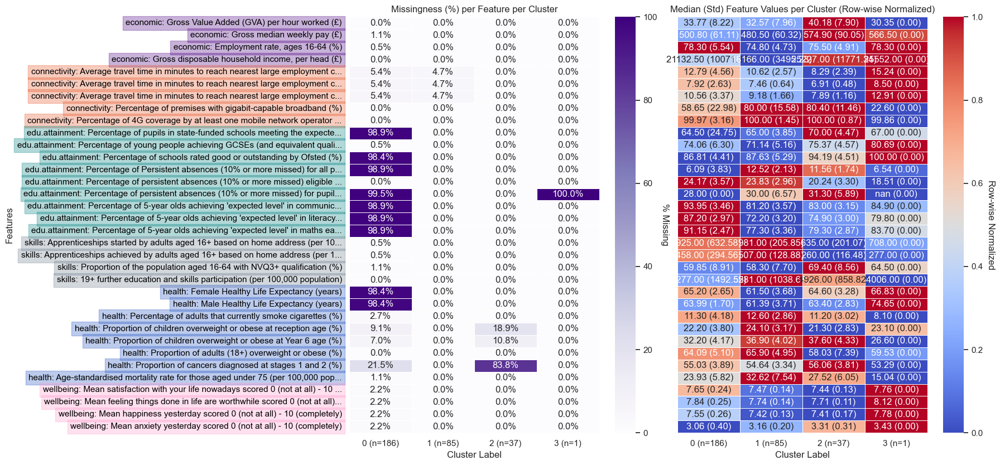

(Cluster                                                     0         1  \
 economic: Gross Value Added (GVA) per hour work...   0.000000  0.000000   
 economic: Gross median weekly pay (£)                1.075269  0.000000   
 economic: Employment rate, ages 16-64 (%)            0.537634  0.000000   
 economic: Gross disposable household income, pe...   0.000000  0.000000   
 connectivity: Average travel time in minutes to...   5.376344  4.705882   
 connectivity: Average travel time in minutes to...   5.376344  4.705882   
 connectivity: Average travel time in minutes to...   5.376344  4.705882   
 connectivity: Percentage of premises with gigab...   0.000000  0.000000   
 connectivity: Percentage of 4G coverage by at l...   0.000000  0.000000   
 edu.attainment: Percentage of pupils in state-f...  98.924731  0.000000   
 edu.attainment: Percentage of young people achi...   0.537634  0.000000   
 edu.attainment: Percentage of schools rated goo...  98.387097  0.000000   
 edu.attainm

In [94]:
from EDA_plots import plot_missingness_and_means
from data_preprocessing import DEFAULT_META_COLS as META_COLS

# Apply
views_custom_hex_palette = [
    "#4B0082", "#E55526", "#008080",
    "#708090", "#2253C3", "#FF99CC", "#1D0E2A", "#AFF9A2", "#FFFF00",
]

plot_missingness_and_means(
    views, 
    MVSF_labels, 
    area_codes, 
    META_COLS, 
    views_custom_hex_palette,
    savepath=r".\Pictures\MVSF_Clusters_Summaries.png", dpi=600)


#### Comparison vs. Canonical profiles

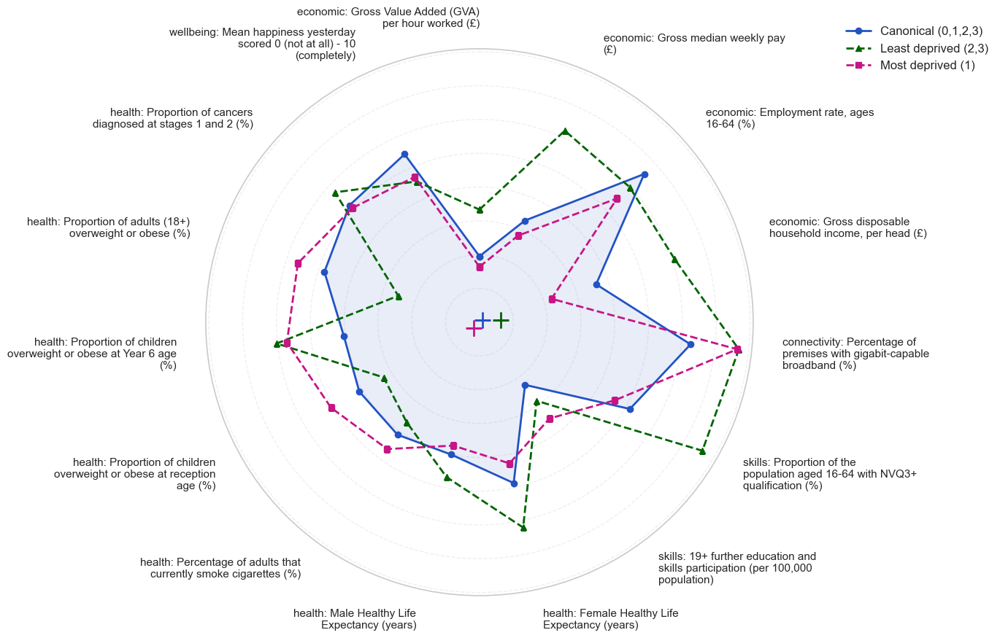

In [177]:
from EDA_plots import canonical_feature_signs, custom_hex_palette, radar_plot_clusters_on_canonical_features

profiles_grouped = radar_plot_clusters_on_canonical_features(
    views=views,
    labels=MVSF_labels,
    area_codes=area_codes,
    canonical_feature_signs=canonical_feature_signs,
    color_palette=custom_hex_palette,

    # legacy args
    exclude_clusters=None,
    combine_groups=None,

    # controls
    direction_align=False,
    strict_complete_cases=False,
    normalization_scope="complete_cases",

    # grouped subsets
    canonical_clusters=None,     # include ALL clusters automatically
    least_deprived_clusters=[2,3],
    most_deprived_clusters=[1],
    canonical_use_all=True,
)

#### Silhouette Report

[ablation] similarity-based (k=4, n_pca=2), baseline=0.9794


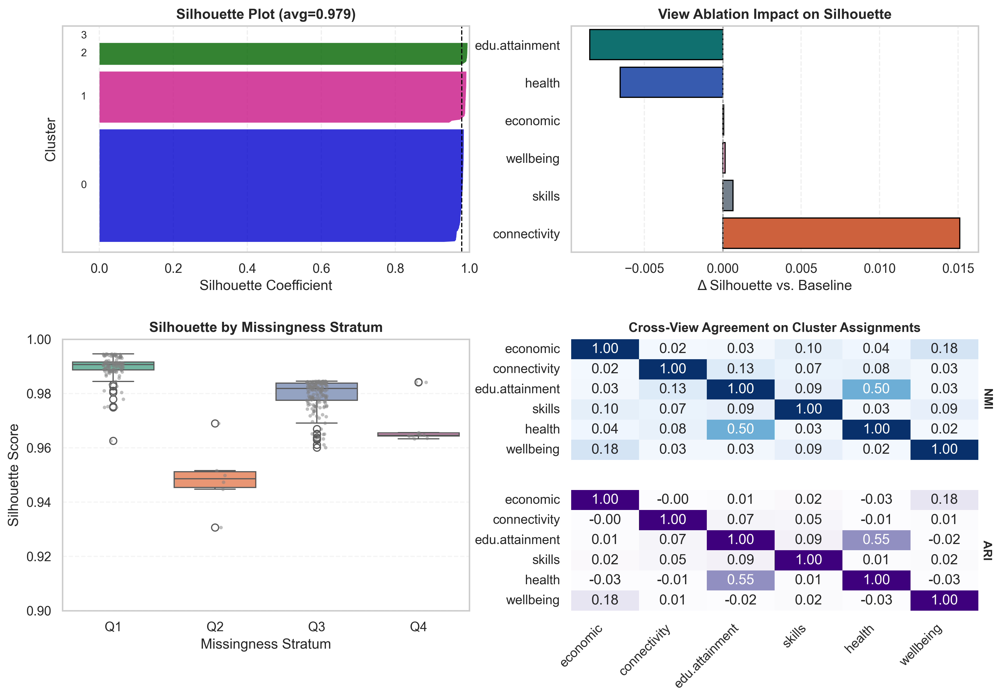

In [118]:
from diagnostics_reports import ablation_importance_from_out, plot_silhouette_report
from similarity_based_methods import multiview_similarity_fusion, cluster_from_similarity

# Palettes
views_custom_hex_palette = [
    "#4B0082", "#E55526", "#008080",
    "#708090", "#2253C3", "#FF99CC", "#1D0E2A", "#AFF9A2", "#FFFF00",
]
clusters_custom_hex_palette = [
    "#0202CD", "#C71585", "#006400", "#8B4513",
    "#1D0E2A", "#4B0082", "#E55526", "#008080",
    "#708090", "#2253C3", "#FF99CC", "#AFF9A2",
]

# Compute view ablation
ablation_df_view = ablation_importance_from_out(
    method_out=MVSF_out,
    views=views,
    k=4,
    n_pca=2,
    multiview_similarity_fusion=multiview_similarity_fusion,
    cluster_from_similarity=cluster_from_similarity,
    mode="view"
)

# Build dict of similarity matrices
view_names = list(views.keys())
similarity_matrices_dict = {vn: S for vn, S in zip(view_names, MVSF_similarity_matrices)}

# Plot Silhouette Report for MVSF
fig, sil_df = plot_silhouette_report(
    embedding=MVSF_embedding,
    labels=MVSF_labels,
    views_dict=views,
    area_codes=area_codes,
    ablation_df_view=ablation_df_view,
    similarity_matrices=similarity_matrices_dict,
    view_names=view_names,
    views_palette=views_custom_hex_palette,
    clusters_palette=clusters_custom_hex_palette,
    strat_method="quantiles",
    figsize=(14, 9),
    box_ylim=(0.9, 1.0),
    dpi=300,
)

# Save to file
fig.savefig(".\Pictures\MVSF_silhouette_report.png", dpi=300, bbox_inches="tight")

[feature-ablation] baseline metric=0.9794 (k=4, n_pca=2)
[feature-ablation] candidates: 20 features across 6 views.
  - [1/20] economic :: drop 'Gross Value Added (GVA) per hour worked (£)'
  - [20/20] wellbeing :: drop 'Mean anxiety yesterday scored 0 (not at all) - 10 (completely)'


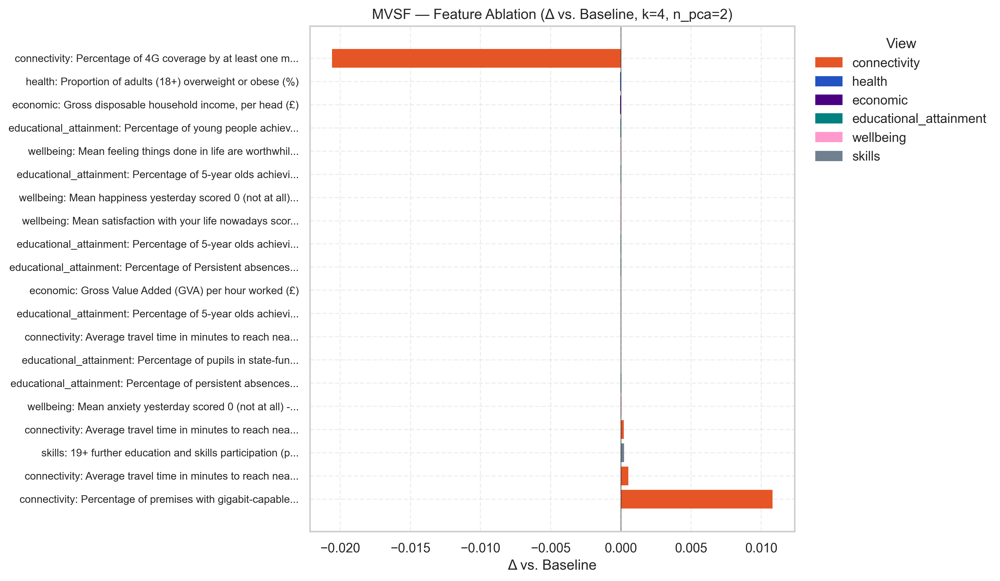

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches

# Feature Ablation

from typing import Dict, List, Optional, Sequence, Tuple
import numpy as np
import pandas as pd

def _metric_from_grid(grid: pd.DataFrame) -> float:
    """Return the best (max) metric from a clustering grid DataFrame."""
    if not isinstance(grid, pd.DataFrame) or grid.empty:
        raise ValueError("Expected a non-empty grid DataFrame.")
    for col in ("Silhouette", "silhouette", "score", "Metric", "metric"):
        if col in grid.columns:
            s = pd.to_numeric(grid[col], errors="coerce")
            if s.notna().any():
                return float(s.max())
    raise ValueError("No usable metric column in grid (need one of Silhouette/silhouette/score/Metric/metric).")


def _extract_S_and_index_strict(obj) -> Tuple[np.ndarray, Sequence]:
    """
    Strict extractor for fusion output. Supports:
        dict: {"S_fused": S, "area_codes": index}
        tuple/list: (S, index)
    """
    if isinstance(obj, dict):
        if "S_fused" not in obj or "area_codes" not in obj:
            raise KeyError("Fusion output dict must include keys 'S_fused' and 'area_codes'.")
        return obj["S_fused"], obj["area_codes"]
    if isinstance(obj, (tuple, list)) and len(obj) >= 2:
        return obj[0], obj[1]
    raise TypeError("Unsupported fusion return type; expected dict or (S, area_codes).")


def feature_ablation_importance(
    *,
    views: Dict[str, pd.DataFrame],
    multiview_similarity_fusion,
    cluster_from_similarity,
    k: int,
    n_pca: int,
    meta_cols: Optional[Sequence[str]] = None,
    feature_limit_per_view: Optional[int] = None,   # cap to speed up
    numeric_only: bool = True,
    verbose: bool = True,
) -> pd.DataFrame:
    """
    Drop-one-*feature* ablation using your existing fusion + clustering routines.

    Parameters
    ----------
    views : dict[name -> DataFrame]
        Your raw views (same object you pass to fusion).
    multiview_similarity_fusion : callable
        Must return {"S_fused": S, "area_codes": ...} on the provided (possibly modified) views dict.
    cluster_from_similarity : callable
        Must return (best, grid_df) where grid_df has a metric column (e.g., 'Silhouette').
    k, n_pca : int
        Clustering hyperparameters (explicit).
    meta_cols : list[str] or None
        Columns to exclude from feature set (defaults to META_COLS).
    feature_limit_per_view : int or None
        If set, only the first N eligible features per view are ablated (useful for speed).
    numeric_only : bool
        If True, ablate only numeric columns (recommended).
    verbose : bool
        Print progress and any failures.

    Returns
    -------
    pd.DataFrame with columns:
        ['View', 'Feature', 'Silhouette', 'Δ vs. Baseline']
    """
    meta_cols = list(meta_cols or META_COLS)

    # ---------------- Baseline (all features present) ----------------
    base_ret = multiview_similarity_fusion(views)
    S_full, acodes = _extract_S_and_index_strict(base_ret)
    _, grid_full = cluster_from_similarity(S_full, acodes, k_range=[int(k)], n_pca_range=[int(n_pca)], verbose=False)
    baseline = _metric_from_grid(grid_full)
    if verbose:
        print(f"[feature-ablation] baseline metric={baseline:.4f} (k={k}, n_pca={n_pca})")

    # ---------------- Build candidate feature list -------------------
    candidates: List[Tuple[str, str]] = []  # (view_name, feature_name)
    for vname, df in views.items():
        # Determine candidate columns without touching the original df
        cols = df.columns.tolist()
        # Drop meta
        cols = [c for c in cols if c not in meta_cols]
        # Keep numeric only, if requested
        if numeric_only:
            num_cols = set(df.select_dtypes(include='number').columns)
            cols = [c for c in cols if c in num_cols]
        # Optional cap
        if feature_limit_per_view is not None:
            cols = cols[: int(feature_limit_per_view)]
        # Append
        for c in cols:
            candidates.append((vname, c))

    if verbose:
        print(f"[feature-ablation] candidates: {len(candidates)} features across {len(views)} views.")

    # Drop-one-feature loop
    rows = []
    for idx, (vname, feat) in enumerate(candidates, 1):
        if verbose and (idx % 25 == 0 or idx == 1 or idx == len(candidates)):
            print(f"  - [{idx}/{len(candidates)}] {vname} :: drop '{feat}'")

        # Shallow copy dict; replace only the modified view with a shallow copy of its DataFrame
        vsub = dict(views)
        vsub_view = vsub[vname].copy()
        # Drop the feature; if missing unexpectedly, it's a no-op
        vsub_view = vsub_view.drop(columns=[feat], errors='ignore')
        vsub[vname] = vsub_view

        try:
            fr = multiview_similarity_fusion(vsub)
            S_sub, ac_sub = _extract_S_and_index_strict(fr)
            _, grid_sub = cluster_from_similarity(S_sub, ac_sub, k_range=[int(k)], n_pca_range=[int(n_pca)], verbose=False)
            sil = _metric_from_grid(grid_sub)
        except Exception as e:
            if verbose:
                print(f"    [warn] drop {vname}::{feat} failed: {e}")
            sil = np.nan

        delta = sil - baseline if (isinstance(sil, (int, float, np.floating)) and not pd.isna(sil)) else np.nan
        rows.append({"View": vname, "Feature": feat, "Silhouette": sil, "Δ vs. Baseline": delta})

    df = pd.DataFrame(rows)
    return df.sort_values("Δ vs. Baseline")


def _view_color_map(views: Dict[str, pd.DataFrame], palette: Sequence[str]) -> Dict[str, str]:
    """
    Deterministic mapping: each view name gets a color from the palette
    using the order in views.keys().
    """
    vnames = list(views.keys())
    return {vn: palette[i % len(palette)] for i, vn in enumerate(vnames)}

def colorize_feature_ablation_df(
    ablation_df_feature: pd.DataFrame,
    views: Dict[str, pd.DataFrame],
    views_custom_hex_palette: Sequence[str],
    *,
    make_label: bool = True,
    label_fmt: str = "{view}: {feature}",
) -> pd.DataFrame:
    """
    Return a copy of ablation_df_feature with:
      - 'Color' column (hex, by View)
      - 'Feature Label' column (optional: '{view}: {feature}')
    """
    df = ablation_df_feature.copy()
    cmap = _view_color_map(views, views_custom_hex_palette)
    df["Color"] = df["View"].map(cmap)
    if make_label:
        df["Feature Label"] = df.apply(lambda r: label_fmt.format(view=r["View"], feature=r["Feature"]), axis=1)
    return df

def plot_feature_ablation_bars(
    ablation_df_feature: pd.DataFrame,
    views: Dict[str, pd.DataFrame],
    views_custom_hex_palette: Sequence[str],
    *,
    sort_by: str = "Δ vs. Baseline",
    ascending: bool = True,
    top_n: int = 50,
    max_label_len: int = 60,
    title: str = "Feature Ablation (Δ vs. Baseline)",
    figsize: Tuple[float, float] | None = None,
    dpi: int = 300,
    savepath: str | None = None,
):
    """
    Plot horizontal bars for feature ablation, color-coded by each feature's view.

    Returns
    -------
    fig, ax, df_top : (matplotlib.figure.Figure, matplotlib.axes.Axes, pd.DataFrame)
        df_top is the sorted + truncated data actually plotted.
    """
    def _truncate(s: str, n: int) -> str:
        s = str(s)
        return s if len(s) <= n else s[: max(0, n - 3)] + "..."

    df = colorize_feature_ablation_df(ablation_df_feature, views, views_custom_hex_palette, make_label=True)
    # Sort & take top_n (NaNs go last)
    df = df.sort_values(sort_by, ascending=ascending, na_position="last").head(top_n)

    # Labels & colors
    ylabels = [ _truncate(lbl, max_label_len) for lbl in df["Feature Label"] ]
    colors  = df["Color"].tolist()
    values  = pd.to_numeric(df[sort_by], errors="coerce").values

    # Figure sizing
    if figsize is None:
        h = min(max(4.0, 0.35 * len(df)), 20.0)
        figsize = (12.0, h)

    fig, ax = plt.subplots(figsize=figsize, dpi=dpi)
    y = np.arange(len(df))[::-1]  # plot top at top
    ax.barh(y, values[::-1], color=colors[::-1], edgecolor="none")
    ax.axvline(0, lw=1, color="black", alpha=0.4)
    ax.set_yticks(y)
    ax.set_yticklabels(ylabels[::-1], fontsize=9)
    ax.invert_yaxis()

    ax.set_xlabel(sort_by)
    ax.set_title(title)

    # Build legend from present views only
    present_views = df["View"].dropna().unique().tolist()
    cmap = _view_color_map(views, views_custom_hex_palette)
    patches = [mpatches.Patch(color=cmap[v], label=v) for v in present_views if v in cmap]
    if patches:
        ax.legend(handles=patches, title="View", bbox_to_anchor=(1.02, 1), loc="upper left", frameon=False)

    fig.tight_layout()
    if savepath:
        fig.savefig(savepath, dpi=dpi, bbox_inches="tight")
    return fig, ax, df

ablation_df_feature = feature_ablation_importance(
    views=views,
    multiview_similarity_fusion=multiview_similarity_fusion,
    cluster_from_similarity=cluster_from_similarity,
    k=4, n_pca=2,
    meta_cols=['Area Code','Area','Area Level','Area Name','Local Authority','LA Name'],
    feature_limit_per_view=None,
    numeric_only=True,
    verbose=True
)

# color palette per view
views_custom_hex_palette = [
    "#4B0082", "#E55526", "#008080",
    "#708090", "#2253C3", "#FF99CC", "#1D0E2A", "#AFF9A2", "#FFFF00",
]

# plot
fig, ax, df_top = plot_feature_ablation_bars(
    ablation_df_feature,
    views=views,
    views_custom_hex_palette=views_custom_hex_palette,
    sort_by="Δ vs. Baseline",
    ascending=True,
    top_n=50,
    title=f"MVSF — Feature Ablation (Δ vs. Baseline, k={4}, n_pca={2})",
    savepath=None,
    dpi=300
)

Silhouette score: 0.9793770458449116
Calinski-Harabasz score: 201340.1698848326
Davies-Bouldin_score: 0.01799680589155388


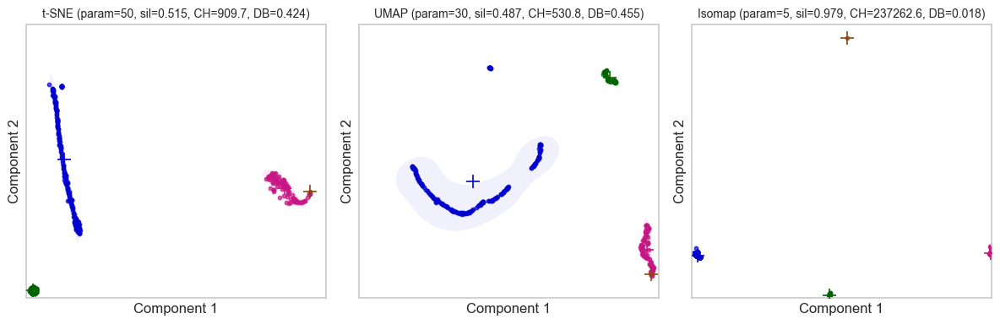

{'t-SNE': {'embedding': array([[ 1.51664009e+01,  3.89553756e-02],
         [ 1.50512867e+01,  4.32136327e-01],
         [ 1.59023161e+01, -1.39376521e-02],
         [ 1.56375122e+01,  4.86634254e-01],
         [ 1.64629211e+01,  3.58566493e-02],
         [ 1.82229748e+01, -2.17901349e+00],
         [ 1.69477253e+01, -7.34815955e-01],
         [ 1.75616016e+01, -1.70833170e+00],
         [ 1.64991684e+01, -2.10843539e+00],
         [ 1.48052282e+01,  1.05191156e-01],
         [ 1.84997616e+01, -2.41573501e+00],
         [ 1.54129696e+01,  1.71144143e-01],
         [ 1.87471752e+01, -2.61020970e+00],
         [ 1.76703987e+01, -1.41136181e+00],
         [ 1.56175098e+01,  7.10493028e-01],
         [-1.39052143e+01, -1.34275017e+01],
         [ 2.03067207e+01, -1.37554777e+00],
         [ 1.51721239e+01,  4.00035977e-01],
         [ 1.96734047e+01, -2.45238686e+00],
         [ 1.73530960e+01, -1.01106441e+00],
         [ 1.63300877e+01, -2.87840247e-01],
         [-1.44516144e+01, -1.283

In [97]:
from plots_and_visualisations import plot_best_embedding
from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score

# Cluster validation
print("Silhouette score:",silhouette_score(MVSF_embedding, MVSF_labels))
print("Calinski-Harabasz score:",calinski_harabasz_score(MVSF_embedding, MVSF_labels))
print("Davies-Bouldin_score:", davies_bouldin_score(MVSF_embedding, MVSF_labels))

# Embedding plot
plot_best_embedding(MVSF_embedding, MVSF_labels)

#### Fusion Report

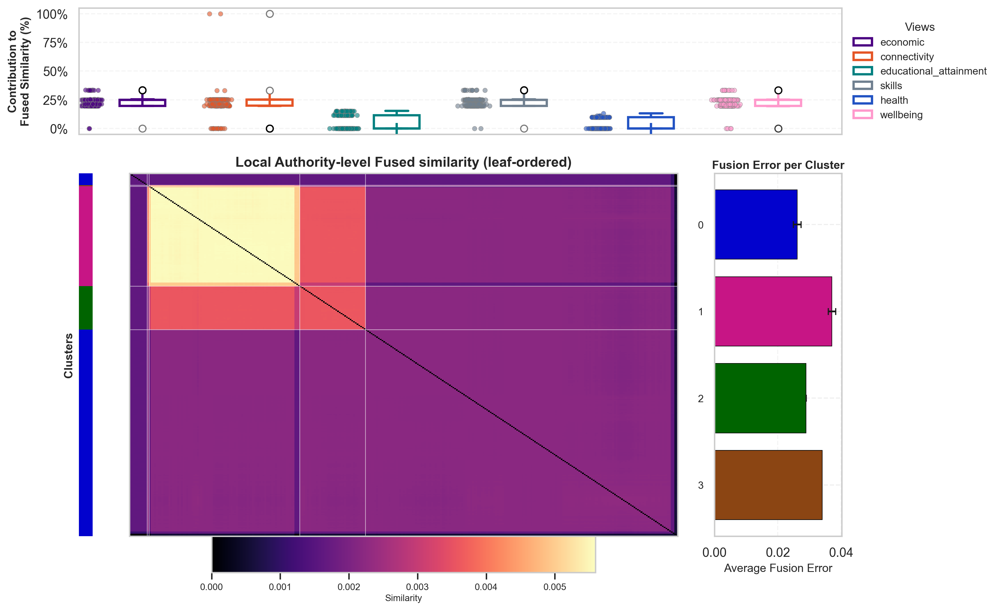

In [173]:
from diagnostics_reports import plot_fusion_report

fusion_report = plot_fusion_report(
    method_out=MVSF_out,
    views_custom_hex_palette=[
        "#4B0082", "#E55526", "#008080",
        "#708090", "#2253C3", "#FF99CC", "#1D0E2A", "#AFF9A2", "#FFFF00"
    ],
    clusters_custom_hex_palette=[
        "#0202CD", "#C71585", "#006400", "#8B4513", "#1D0E2A", "#4B0082",
        "#E55526", "#008080", "#708090", "#2253C3", "#FF99CC", "#1D0E2A", "#AFF9A2"
    ],
    linkage_method="average",
    figsize=(10, 8),
    dpi=300,
    heatmap_cmap="magma",
    savepath=r".\Pictures\MVSF_Fusion_Report.png"
)

##### Fusion Graph

,community,edges,dominant_view,count_connectivity,count_health,count_wellbeing,count_educational_attainment
0,0,644,connectivity,443,150.0,26.0,25.0
1,1,570,health,90,445.0,NaN,35.0
2,2,281,educational_attainment,99,NaN,8.0,174.0
3,3,429,connectivity,422,NaN,7.0,NaN
4,4,67,connectivity,55,NaN,12.0,NaN


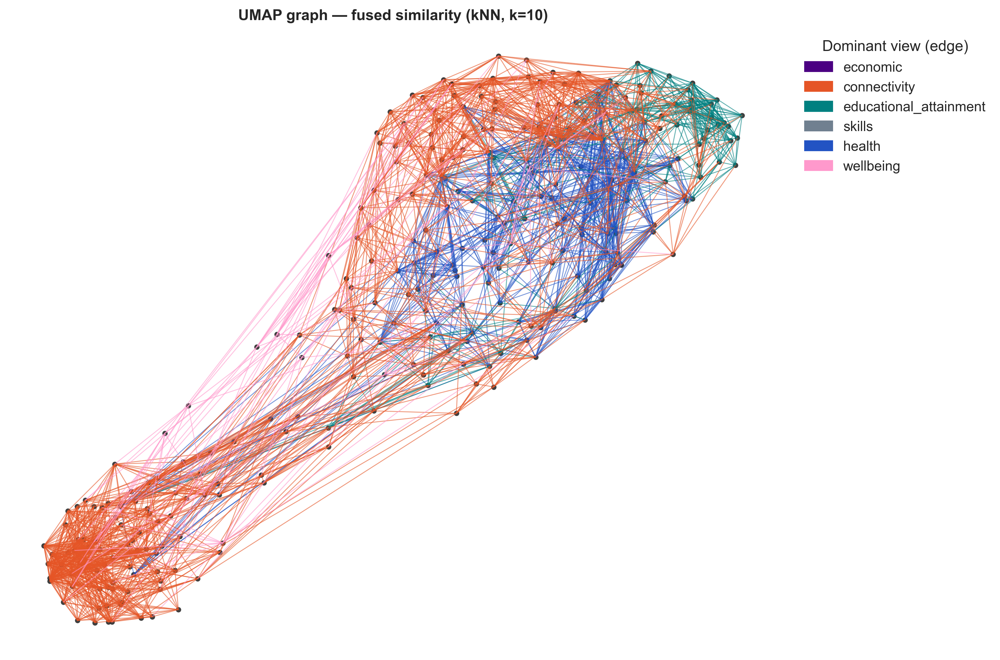

In [158]:
from plots_and_visualisations import plot_mvsf_graph

fig, ax, res = plot_mvsf_graph(
    method_out=MVSF_out,
    mode="full",
    top_k_edges=10,               # per-node kNN in fused S
    n_neighbors_umap=30,
    min_dist_umap=0.05,
    view_palette=["#4B0082","#E55526","#008080","#708090","#2253C3","#FF99CC"],  # optional
    figsize=(11, 9), dpi=300
)
res["community_summary"]  # view-dominance per detected community


,i,j,w,dominant_view,w_dominant,view_maxes
0,43,271,0.005562,health,0.011814,"{'economic': 0.0032679865135048025, 'connectiv..."
1,23,271,0.005561,health,0.011821,"{'economic': 0.003267985325656968, 'connectivi..."
2,48,271,0.005560,health,0.011817,"{'economic': 0.0032679858447384707, 'connectiv..."
3,44,271,0.005559,health,0.011796,"{'economic': 0.0032680035687636336, 'connectiv..."
4,248,271,0.005557,health,0.011824,"{'economic': 0.0032679872647572296, 'connectiv..."
5,12,271,0.005557,health,0.011797,"{'economic': 0.0032680026948069575, 'connectiv..."
6,255,271,0.005557,health,0.011805,"{'economic': 0.0032679998871933086, 'connectiv..."
7,13,271,0.005557,health,0.011811,"{'economic': 0.0032679919793623196, 'connectiv..."
8,18,271,0.005556,health,0.011810,"{'economic': 0.003267985600786494, 'connectivi..."
9,50,271,0.005555,health,0.011817,"{'economic': 0.0032679833037889566, 'connectiv..."


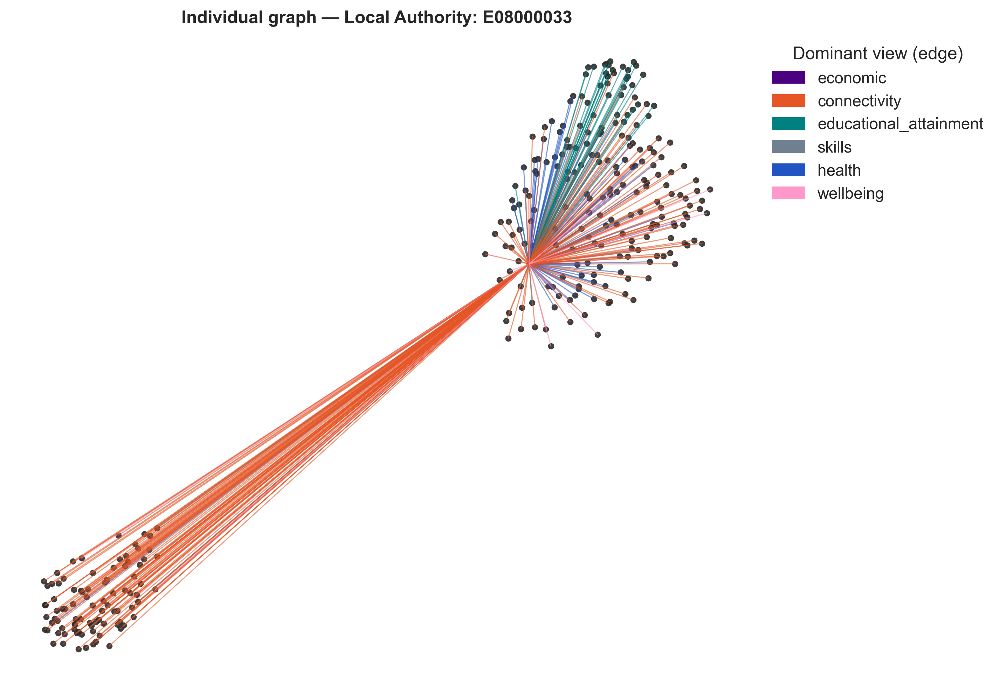

In [159]:
from plots_and_visualisations import plot_mvsf_graph

# Individual graph for E08000033
target = "E08000033"

# optional: keep view colors consistent
views_custom_hex_palette = ["#4B0082","#E55526","#008080","#708090","#2253C3","#FF99CC","#1D0E2A","#AFF9A2","#FFFF00"]

fig, ax, res = plot_mvsf_graph(
    method_out=MVSF_out,
    mode="ego",
    ego_area_code=target,
    top_k_edges=308,
    n_neighbors_umap=20,
    min_dist_umap=0.05,
    view_palette=views_custom_hex_palette,
    figsize=(9, 8),
    dpi=300,
    title=f"Individual graph — Local Authority: {target}"
)

# Optionally inspect the edges drawn (pairwise similarities & which view dominates)
res["edges"].head(20)


### CFE - Evaluation and Diagnostics

#### Cluster Summaries

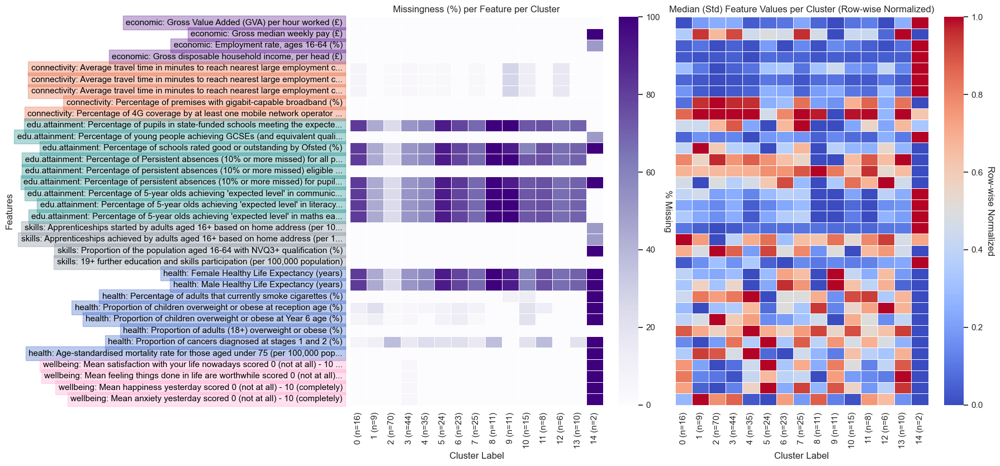

(Cluster                                                 0          1  \
 economic: Gross Value Added (GVA) per hour work...   0.00   0.000000   
 economic: Gross median weekly pay (£)                0.00   0.000000   
 economic: Employment rate, ages 16-64 (%)            0.00   0.000000   
 economic: Gross disposable household income, pe...   0.00   0.000000   
 connectivity: Average travel time in minutes to...   6.25   0.000000   
 connectivity: Average travel time in minutes to...   6.25   0.000000   
 connectivity: Average travel time in minutes to...   6.25   0.000000   
 connectivity: Percentage of premises with gigab...   0.00   0.000000   
 connectivity: Percentage of 4G coverage by at l...   0.00   0.000000   
 edu.attainment: Percentage of pupils in state-f...  81.25  44.444444   
 edu.attainment: Percentage of young people achi...   0.00   0.000000   
 edu.attainment: Percentage of schools rated goo...  81.25  44.444444   
 edu.attainment: Percentage of Persistent absenc...

In [99]:
from EDA_plots import plot_missingness_and_means
from data_preprocessing import DEFAULT_META_COLS as META_COLS

# Apply
views_custom_hex_palette = [
    "#4B0082", "#E55526", "#008080",
    "#708090", "#2253C3", "#FF99CC", "#1D0E2A", "#AFF9A2", "#FFFF00",
]

plot_missingness_and_means(
    views, 
    CFE_labels, 
    area_codes, 
    META_COLS, 
    views_custom_hex_palette,
    savepath=r".\Pictures\CFE_Clusters_Summaries.png", dpi=600)


#### Comparison vs. Canonical Profiles

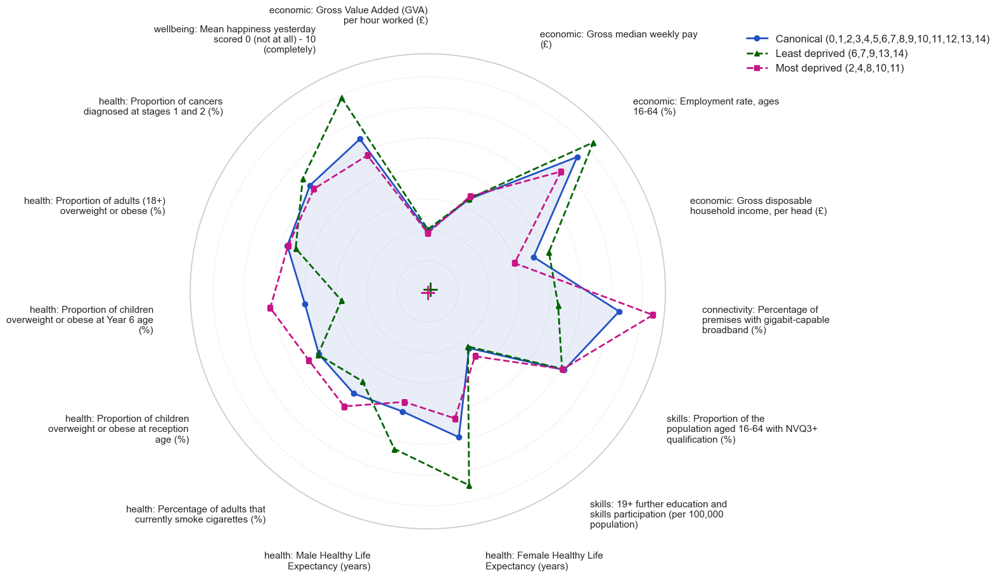

In [178]:
profiles_grouped = radar_plot_clusters_on_canonical_features(
    views=views,
    labels=CFE_labels,
    area_codes=area_codes,
    canonical_feature_signs=canonical_feature_signs,
    color_palette=custom_hex_palette,

    # keep legacy args
    exclude_clusters=None,
    combine_groups=None,

    # usual controls
    direction_align=False,
    strict_complete_cases=False,
    normalization_scope="complete_cases",

    # grouped subsets
    canonical_clusters=None,
    least_deprived_clusters=[6,7,9,13,14],
    most_deprived_clusters=[2,4,8,10,11],
    canonical_use_all=True, 
)

#### Silhouette Report

In [101]:
def align_labels_per_view(clusterings, global_area_codes):
    """
    clusterings: dict like {"economic": {"area_codes": [...], "labels": [...]}, ...}
    global_area_codes: list/array of length N (=309) in the order you plot/report
    Returns: dict {view_name: np.ndarray (N,), values in {0.., -1 for missing}}
    """
    gidx = pd.Index(pd.Series(global_area_codes, dtype=str).str.strip())
    aligned = {}

    for vn, info in clusterings.items():
        v_codes = pd.Series(info["area_codes"], dtype=str).str.strip()
        v_labels = pd.Series(info["labels"], index=v_codes)

        # Reindex to global order; -1 for LAs missing in this view
        aligned[vn] = (
            v_labels.reindex(gidx, fill_value=-1)
                    .astype(int, errors="ignore")
                    .to_numpy()
        )

    return aligned

[ablation] LATE (rank=2, n_pca=4, k=15), baseline=0.8360
N: 309
                economic: shape=(309,), missing(-1)=2
            connectivity: shape=(309,), missing(-1)=14
  educational_attainment: shape=(309,), missing(-1)=187
                  skills: shape=(309,), missing(-1)=2
                  health: shape=(309,), missing(-1)=223
               wellbeing: shape=(309,), missing(-1)=4


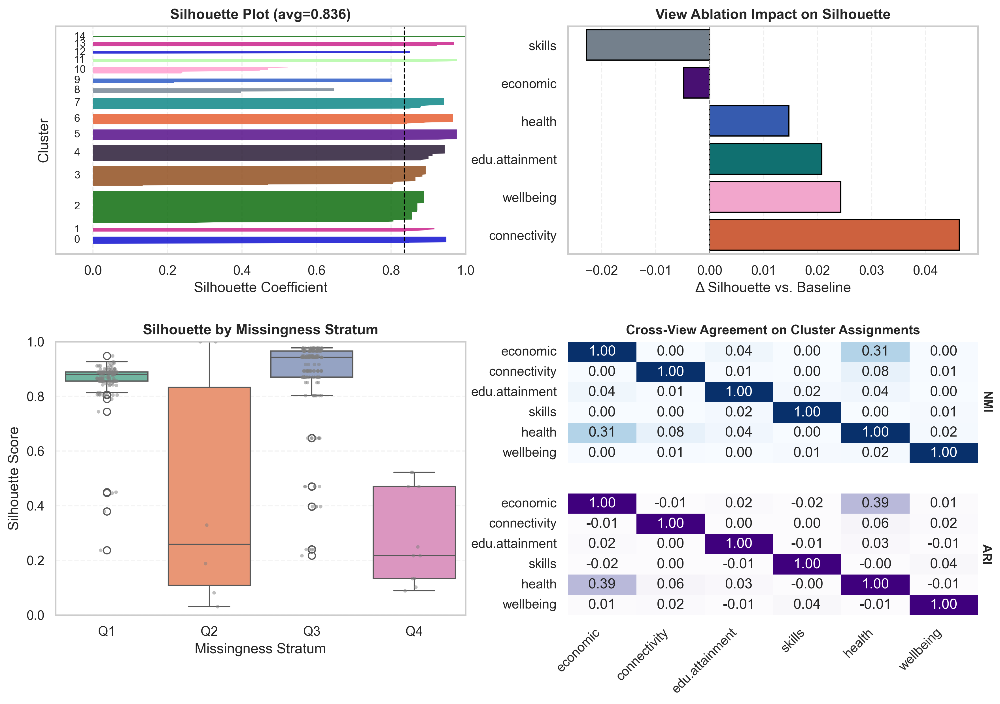

In [102]:
from diagnostics_reports import ablation_importance_from_out, plot_silhouette_report

# View ablation for late method
ablation_df_view = ablation_importance_from_out(
    method_out=CFE_out,
    views=views,
    run_late_fn=run_late_nmf_coassoc_pca_kmeans,  # late pipeline
    mode="view",
    verbose=True
)

# Palettes
views_palette = [
    "#4B0082", "#E55526", "#008080", "#708090", "#2253C3",
    "#FF99CC", "#1D0E2A", "#AFF9A2", "#FFFF00",
]
clusters_palette = [
    "#0202CD", "#C71585", "#006400", "#8B4513", "#1D0E2A",
    "#4B0082", "#E55526", "#008080", "#708090", "#2253C3",
    "#FF99CC", "#AFF9A2",
]

# Compute labels per view
# Align per-view labels to the master area_codes
labels_per_view_aligned = align_labels_per_view(CFE_out["clusterings"], area_codes)

print("N:", len(area_codes))
for vn, arr in labels_per_view_aligned.items():
    n_missing = int((arr == -1).sum())
    print(f"{vn:>24}: shape={arr.shape}, missing(-1)={n_missing}")

# Silhouette report
fig, sil_df = plot_silhouette_report(
    embedding=CFE_embedding,
    labels=CFE_labels,
    views_dict=views,
    area_codes=area_codes,
    ablation_df_view=ablation_df_view,
    similarity_matrices=None,
    labels_per_view=labels_per_view_aligned,
    view_names=list(views.keys()),
    views_palette=views_palette,
    clusters_palette=clusters_palette,
    strat_method="quantiles",
    box_ylim=(0.0, 1.0),
    figsize=(14, 9),
    dpi=300,
    nmi_ari_min_overlap=50,
    show_overlap_counts=False
)

# Save or show figure
fig.savefig(".\Pictures\CFE_silhouette_report.png", dpi=300, bbox_inches="tight")

#### Factorization Report

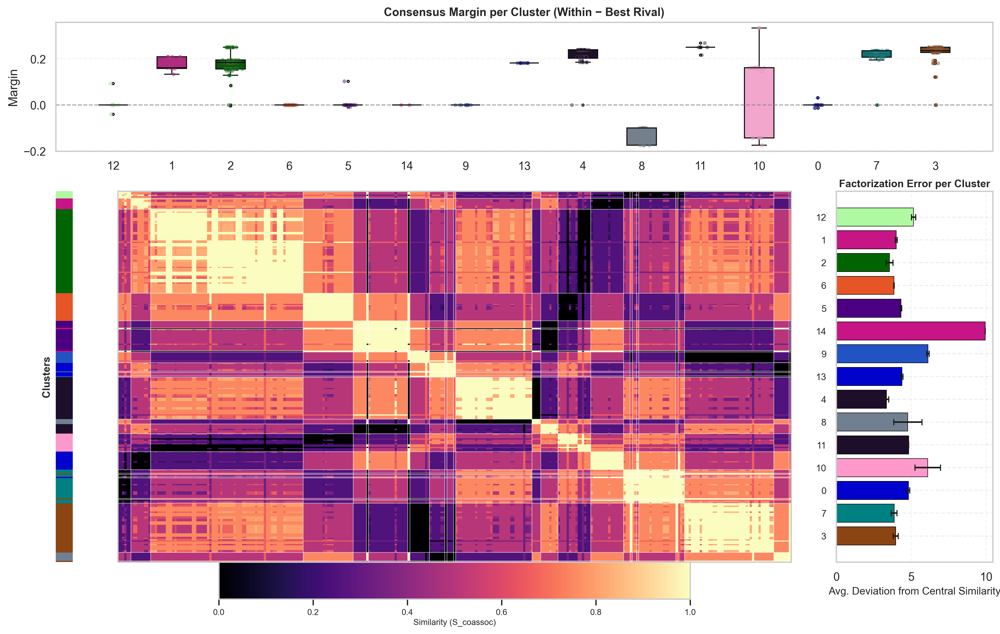

In [113]:
from diagnostics_reports import plot_factorization_report

CFE_report = plot_factorization_report(
    method_out=CFE_out,
    views_custom_hex_palette=views_palette,
    clusters_custom_hex_palette=clusters_palette,
    savepath=r".\Pictures\CFE_factorization_report.png")

### PVNMF - Evaluation and Diagnostics

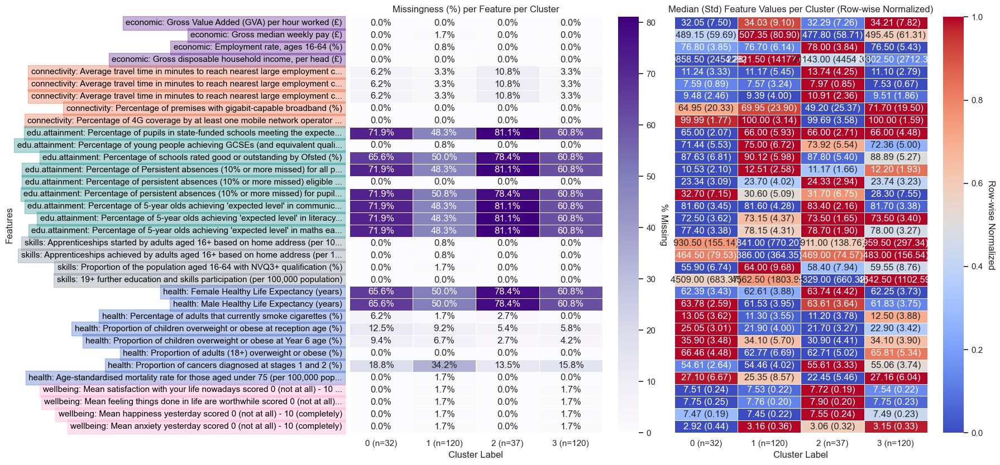

(Cluster                                                  0          1  \
 economic: Gross Value Added (GVA) per hour work...   0.000   0.000000   
 economic: Gross median weekly pay (£)                0.000   1.666667   
 economic: Employment rate, ages 16-64 (%)            0.000   0.833333   
 economic: Gross disposable household income, pe...   0.000   0.000000   
 connectivity: Average travel time in minutes to...   6.250   3.333333   
 connectivity: Average travel time in minutes to...   6.250   3.333333   
 connectivity: Average travel time in minutes to...   6.250   3.333333   
 connectivity: Percentage of premises with gigab...   0.000   0.000000   
 connectivity: Percentage of 4G coverage by at l...   0.000   0.000000   
 edu.attainment: Percentage of pupils in state-f...  71.875  48.333333   
 edu.attainment: Percentage of young people achi...   0.000   0.833333   
 edu.attainment: Percentage of schools rated goo...  65.625  50.000000   
 edu.attainment: Percentage of Persist

In [104]:
from EDA_plots import plot_missingness_and_means
from data_preprocessing import DEFAULT_META_COLS as META_COLS

# Apply
views_custom_hex_palette = [
    "#4B0082", "#E55526", "#008080",
    "#708090", "#2253C3", "#FF99CC", "#1D0E2A", "#AFF9A2", "#FFFF00",
]

plot_missingness_and_means(
    views, 
    PVNMF_labels, 
    area_codes, 
    META_COLS, 
    views_custom_hex_palette,
    savepath=r".\Pictures\PVNMF_Clusters_Summaries.png", dpi=600)


#### Comparison vs. Canonical Profiles

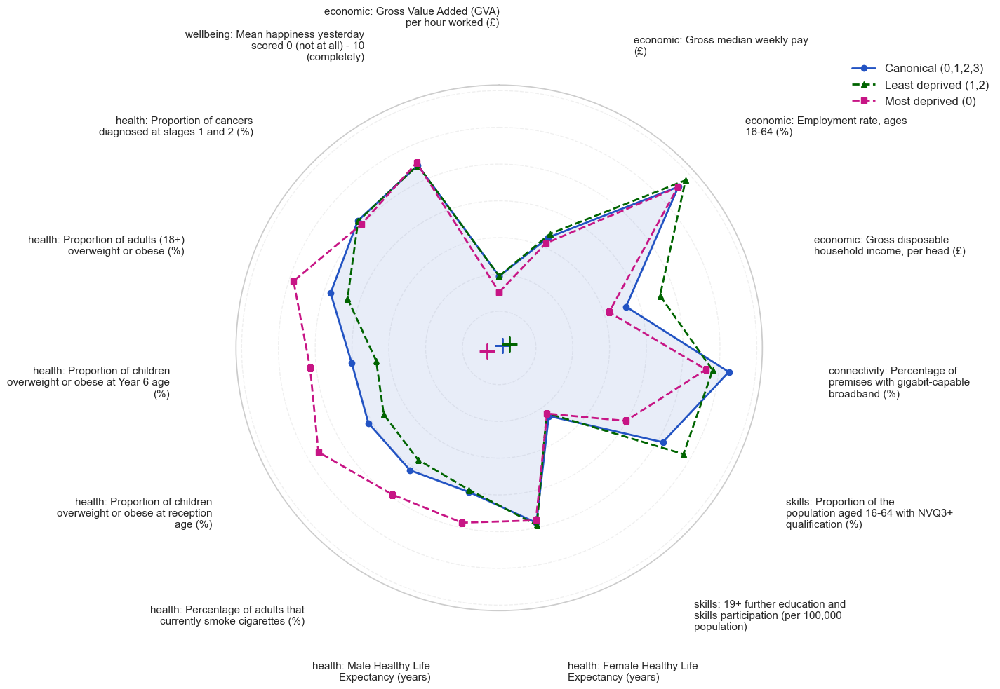

In [179]:
profiles_grouped = radar_plot_clusters_on_canonical_features(
    views=views,
    labels=PVNMF_labels,
    area_codes=area_codes,
    canonical_feature_signs=canonical_feature_signs,
    color_palette=custom_hex_palette,

    # keep legacy args (unused in grouped mode)
    exclude_clusters=None,
    combine_groups=None,

    # usual controls
    direction_align=False,
    strict_complete_cases=False,
    normalization_scope="complete_cases",

    # grouped subsets
    canonical_clusters=None,
    least_deprived_clusters=[1,2],
    most_deprived_clusters=[0],
    canonical_use_all=True,
)

#### Silhouette Report

In [106]:
from data_preprocessing import preprocess_view, exclude_las, DEFAULT_META_COLS

def rebuild_pvnmf_labels(
    views: dict,
    area_codes: list[str],
    rank: int,
    n_pca: int,
    k: int,
    random_state: int = 19042022,
) -> dict[str, np.ndarray]:
    """
    Rebuild per-view labels for PVNMF at fixed (rank, n_pca, k).
    Aligns to area_codes; returns -1 for LAs missing from a view.
    Relies on existing preprocess_view / exclude_las / META_COLS.
    """
    from sklearn.decomposition import NMF, PCA
    from sklearn.cluster import KMeans

    labels_per_view = {}
    idx_map = pd.Index(area_codes, name="Local_Authority_Code")

    for vname, df in views.items():
        # clean like the rest of pipeline
        dfc = preprocess_view(df.copy())
        dfc = exclude_las(dfc.copy(), vname)
        if "Local_Authority_Code" not in dfc.columns:
            # fallback if view still uses "Area Code"
            if "Area Code" in dfc.columns:
                dfc = dfc.rename(columns={"Area Code":"Local_Authority_Code"})
            else:
                raise KeyError(f"[{vname}] missing 'Local_Authority_Code'/'Area Code'")
        dfc = dfc.set_index("Local_Authority_Code")
        dfc = dfc.drop(columns=[c for c in DEFAULT_META_COLS if c in dfc.columns], errors="ignore")
        dfc = dfc.apply(pd.to_numeric, errors="coerce")
        dfc = dfc.dropna(axis=0)  # NMF requires complete rows per view

        if dfc.empty or dfc.shape[0] < k or dfc.shape[1] < rank:
            # not enough rows or features to NMF/cluster -> fill -1
            labels_per_view[vname] = np.full(len(area_codes), -1, dtype=int)
            continue

        # NMF (nonnegative), then PCA, then KMeans
        model = NMF(n_components=min(rank, min(dfc.shape)), init="nndsvda", random_state=random_state)
        G = model.fit_transform(dfc.values)  # (n_v, rank)
        ncomp = min(n_pca, G.shape[0], G.shape[1])
        Z = PCA(n_components=ncomp, random_state=random_state).fit_transform(G)
        labs = KMeans(n_clusters=k, n_init=100, random_state=random_state).fit_predict(Z)

        # align back to full area_codes (missing → -1)
        s = pd.Series(labs, index=dfc.index, dtype=int)
        aligned = s.reindex(idx_map, fill_value=-1).to_numpy()
        labels_per_view[vname] = aligned

    return labels_per_view

import numpy as np
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

def make_pvnmf_similarity_fusion_from_out(method_out):
    # map view names to similarity matrices
    sims_by_view = {vn: S for vn, S in zip(method_out["view_names"], method_out["similarity_matrices"])}
    area_codes = method_out["area_codes"]

    def fuse(vdict):
        # vdict is the views subset; we only use its KEYS to decide which matrices to average
        selected = [sims_by_view[vn] for vn in sims_by_view if vn in vdict]
        if not selected:
            raise ValueError("No overlap between provided views and stored PVNMF views.")
        S = np.mean(selected, axis=0)
        S = 0.5 * (S + S.T)
        np.fill_diagonal(S, 1.0)
        return {"S_fused": S, "area_codes": area_codes}

    return fuse

def cluster_from_similarity(S, area_codes, k_range, n_pca_range, n_init="auto", random_state=19042022, verbose=False):
    # Center S (kernel trick), then PCA -> KMeans, score by silhouette
    n = S.shape[0]
    H = np.eye(n) - np.ones((n, n)) / n
    Kc = H @ S @ H

    rows = []
    best = {"sil": -1.0}
    for p in n_pca_range:
        emb = PCA(n_components=int(p), random_state=random_state).fit_transform(Kc)
        for k in k_range:
            if k < 2 or k > emb.shape[0]:
                continue
            labels = KMeans(n_clusters=int(k), n_init=n_init, random_state=random_state).fit_predict(emb)
            try:
                sil = silhouette_score(emb, labels)
            except ValueError:
                sil = -1.0
            rows.append({"PCA_n_components": int(p), "K": int(k), "Silhouette": float(sil)})
            if sil > best["sil"]:
                best = {"sil": float(sil), "params": (int(p), int(k)), "labels": labels, "embedding": emb}
    grid = pd.DataFrame(rows)
    return best, grid


[ablation] similarity-based (k=4, n_pca=2), baseline=0.5424


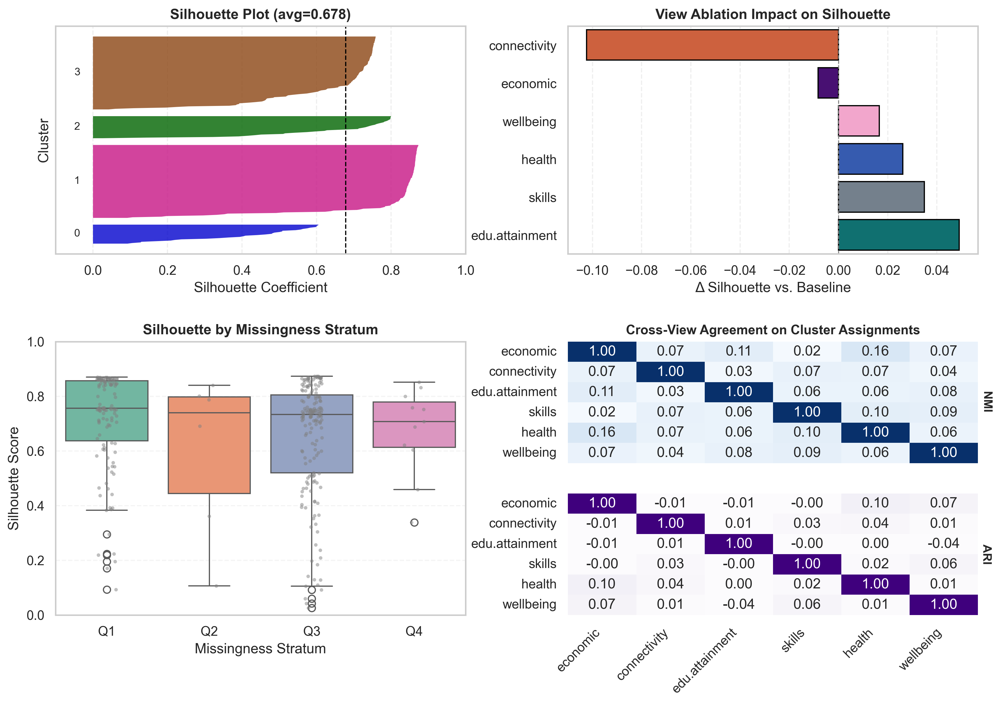

In [107]:
from diagnostics_reports import ablation_importance_from_out, plot_silhouette_report, _get_best_params_from_grid

pvnmf_fusion = make_pvnmf_similarity_fusion_from_out(PVNMF_out)

ablation_df_view = ablation_importance_from_out(
    method_out=PVNMF_out, # has S_fused → similarity-based path is chosen
    views=views, # only the KEYS matter for Option A
    multiview_similarity_fusion=pvnmf_fusion,
    cluster_from_similarity=cluster_from_similarity,
    mode="view",
    verbose=True
)

# Palettes
views_palette = [
    "#4B0082", "#E55526", "#008080", "#708090", "#2253C3",
    "#FF99CC", "#1D0E2A", "#AFF9A2", "#FFFF00",
]
clusters_palette = [
    "#0202CD", "#C71585", "#006400", "#8B4513", "#1D0E2A",
    "#4B0082", "#E55526", "#008080", "#708090", "#2253C3",
    "#FF99CC", "#AFF9A2",
]

# Infer best params using existing helper
bp = _get_best_params_from_grid(PVNMF_out["grid_results"])
PVNMF_out["best_params"] = {
    "k": bp["k"],
    "n_pca": bp["n_pca"],
    "rank": bp["rank"]
}

# Rebuild per-view labels for NMI/ARI panel
labels_per_view = rebuild_pvnmf_labels(
    views=views,
    area_codes=PVNMF_out["area_codes"],
    rank=bp["rank"],
    n_pca=bp["n_pca"],
    k=bp["k"],
)

fig, sil_df = plot_silhouette_report(
    embedding=PVNMF_out["embedding"],
    labels=PVNMF_labels,
    views_dict=views,
    area_codes=area_codes,
    ablation_df_view=ablation_df_view,
    view_names=list(views.keys()),
    labels_per_view=labels_per_view,
    views_palette=["#4B0082", "#E55526", "#008080", "#708090", "#2253C3", "#FF99CC"],
    clusters_palette=["#0202CD", "#C71585", "#006400", "#8B4513", "#FF99CC"],
    strat_method="quantiles",
    box_ylim=(0.0, 1.0),
    figsize=(14, 9),
    dpi=300
)

fig.savefig(".\Pictures\PVNMF_silhouette_report.png", dpi=300, bbox_inches="tight")

#### Factorization Report

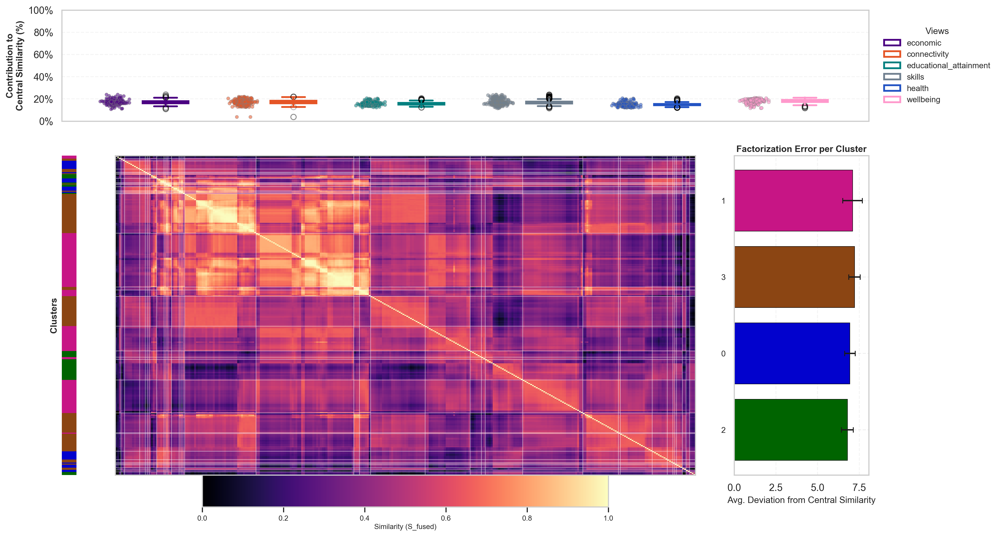

In [114]:
from diagnostics_reports import plot_factorization_report

PVNMF_report = plot_factorization_report(
    method_out=PVNMF_out,
    views_custom_hex_palette=views_palette,
    clusters_custom_hex_palette=clusters_palette,
    linkage_method="average",
    # figsize=(13.5, 9.0),
    dpi=300,
    savepath=r".\Pictures\PVNMF_factorization_report.png"
)

### AECC - Evaluation and Diagnostics

#### Cluster Summaries

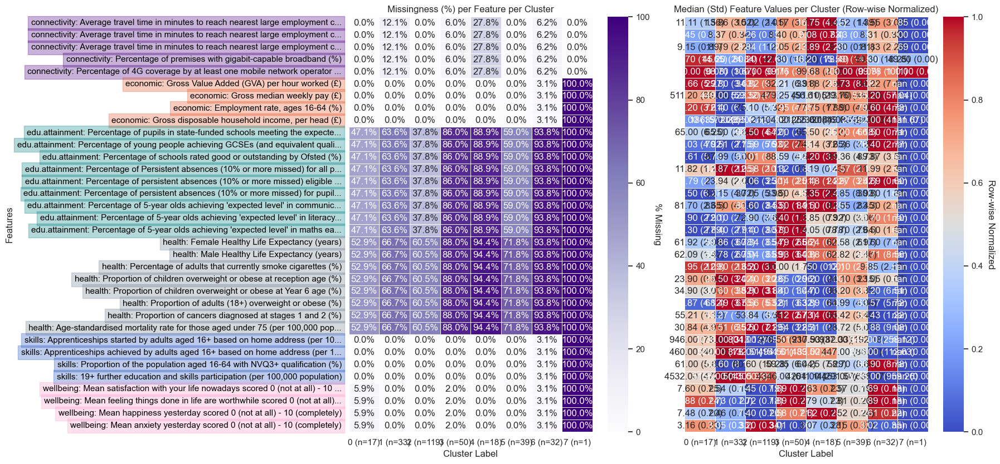

(Cluster                                                     0          1  \
 connectivity: Average travel time in minutes to...   0.000000  12.121212   
 connectivity: Average travel time in minutes to...   0.000000  12.121212   
 connectivity: Average travel time in minutes to...   0.000000  12.121212   
 connectivity: Percentage of premises with gigab...   0.000000  12.121212   
 connectivity: Percentage of 4G coverage by at l...   0.000000  12.121212   
 economic: Gross Value Added (GVA) per hour work...   0.000000   0.000000   
 economic: Gross median weekly pay (£)                0.000000   0.000000   
 economic: Employment rate, ages 16-64 (%)            0.000000   0.000000   
 economic: Gross disposable household income, pe...   0.000000   0.000000   
 edu.attainment: Percentage of pupils in state-f...  47.058824  63.636364   
 edu.attainment: Percentage of young people achi...  47.058824  63.636364   
 edu.attainment: Percentage of schools rated goo...  47.058824  63.636364   

In [109]:
# Rebuild cleaned views exactly as AECC did, then align to the AECC order
views_plot = {}
for vname in sorted(views.keys()):
    dfc = preprocess_view(views[vname].copy())
    dfc = exclude_las(dfc.copy(), vname)
    if "Local_Authority_Code" not in dfc.columns:
        raise KeyError(f"'Local_Authority_Code' missing after exclude_las for {vname}")
    dfc = dfc.set_index("Local_Authority_Code")
    dfc = dfc.drop(columns=[c for c in META_COLS if c in dfc.columns], errors="ignore")
    dfc = dfc.apply(pd.to_numeric, errors="coerce").sort_index()
    views_plot[vname] = dfc.reindex(area_codes)

# Plot
plot_missingness_and_means(
    views_plot,
    AECC_labels,
    area_codes,
    META_COLS,
    views_custom_hex_palette,
    savepath=r".\Pictures\AECC_Clusters_Summaries.png",
    dpi=600
)

#### Comparison vs. Canonical profiles

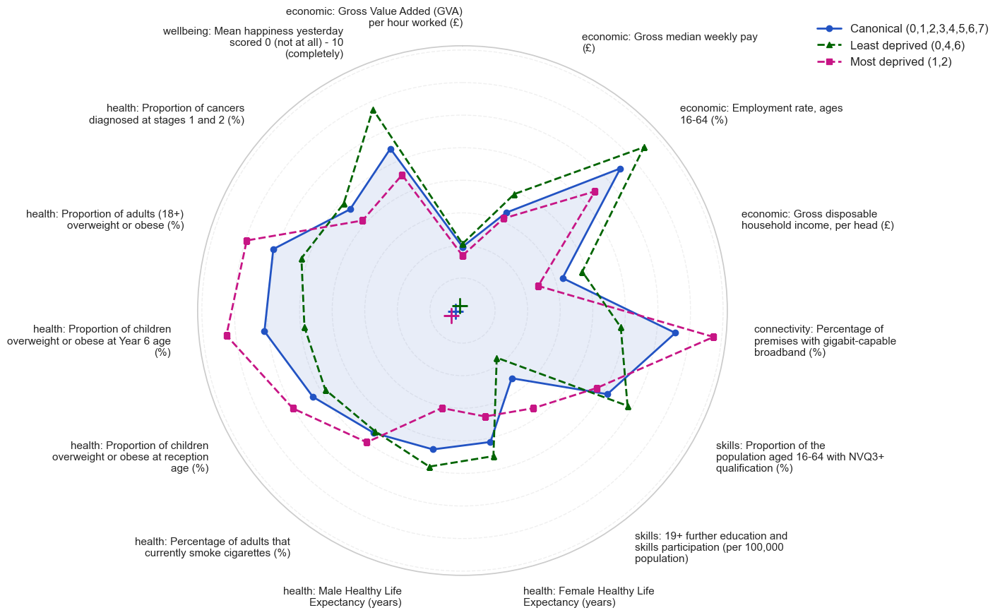

In [180]:
# Align/clean views to the AECC order
views_aligned = {}
for name, df in views.items():
    dfc = preprocess_view(df.copy())
    dfc = exclude_las(dfc.copy(), name).set_index("Local_Authority_Code")
    dfc = dfc.drop(columns=[c for c in META_COLS if c in dfc.columns], errors="ignore")
    dfc = dfc.apply(pd.to_numeric, errors="coerce")
    views_aligned[name] = dfc.reindex(area_codes)  # <-- align to AECC order

# Run the canonical radar profiles using AECC labels/areas
profiles_grouped_aecc = radar_plot_clusters_on_canonical_features(
    views=views_aligned,
    labels=AECC_labels,
    area_codes=area_codes,

    canonical_feature_signs=canonical_feature_signs,
    color_palette=custom_hex_palette,

    # legacy args (kept for API compatibility)
    exclude_clusters=None,
    combine_groups=None,

    # usual controls
    direction_align=False,
    strict_complete_cases=False,
    normalization_scope="complete_cases",

    # grouped subsets
    canonical_clusters=None,
    least_deprived_clusters=[0,4,6],
    most_deprived_clusters=[1,2],
    canonical_use_all=True
)


#### Silhouette Report

[ablation] LATE (rank=10, n_pca=2, k=8), baseline=0.4229


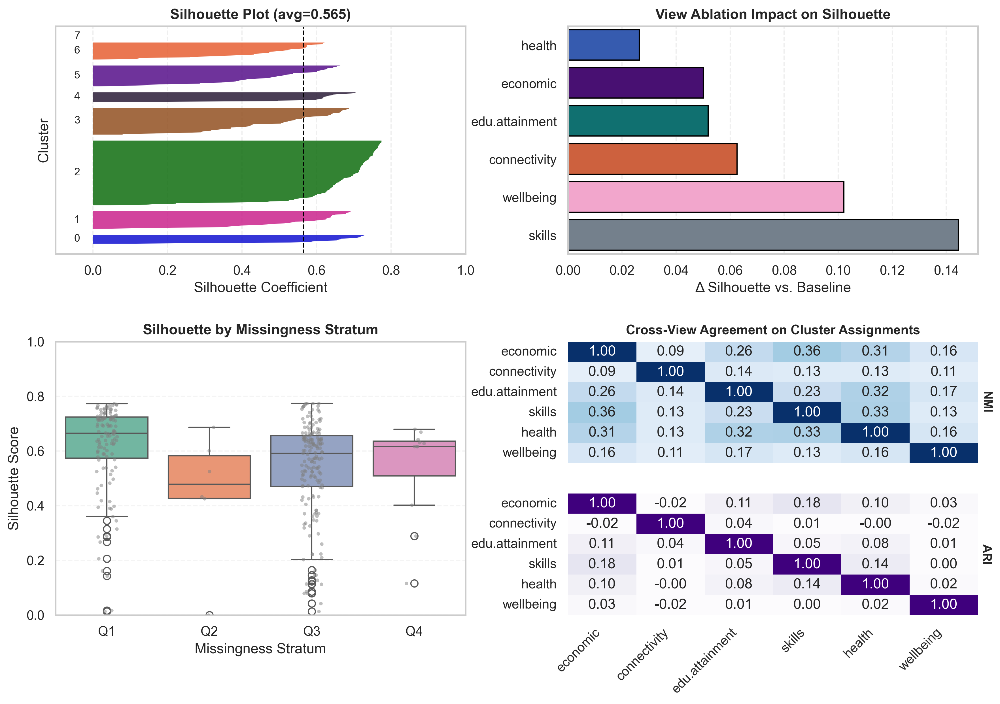

In [111]:
from diagnostics_reports import plot_silhouette_report, ablation_importance_from_out
from copy import deepcopy

def _as_list(x, default):
    if x is None:
        return [default]
    if isinstance(x, (list, tuple, range)):
        return list(x)
    return [x]

def run_aecc_for_ablation(
    *, views,
    rank_range=None, n_pca_range=None, k_range=None,
    n_init="auto", verbose=False, **kw
):
    latent_dim_range = _as_list(rank_range, 10)   # rank -> latent_dim_range
    n_pca_range     = _as_list(n_pca_range, 2)
    k_range         = _as_list(k_range, 8)

    # pass only supported kwargs
    allowed = {"hidden_dim", "epochs", "lr", "random_state"}
    extra = {k: v for k, v in kw.items() if k in allowed}

    return run_late_ae_coassoc_pca_kmeans(
        views=views,
        latent_dim_range=latent_dim_range,
        n_pca_range=n_pca_range,
        k_range=k_range,
        n_init=n_init,
        verbose=verbose,
        **extra
    )

# Pin the baseline to Rank=10, PCA=2, K=8 so ablation uses  exact settings
AECC_out_fixed = deepcopy(AECC_out)
AECC_out_fixed["best_params"] = {
    "Rank": 10,
    "PCA_n_components": 2,
    "k": 8,
    "sil": float(silhouette_score(AECC_out["embedding"], AECC_out["labels"])),
}
    
# Compute view ablation for AECC (late / co-association branch)
ablation_df_view = ablation_importance_from_out(
    method_out=AECC_out_fixed,
    views=views,
    run_late_fn=run_aecc_for_ablation,
    n_init=10,
    verbose=True
)

views_palette = [
    "#4B0082", "#E55526", "#008080", "#708090", "#2253C3",
    "#FF99CC", "#1D0E2A", "#AFF9A2", "#FFFF00",
]
clusters_palette = [
    "#0202CD", "#C71585", "#006400", "#8B4513", "#1D0E2A",
    "#4B0082", "#E55526", "#008080", "#708090", "#2253C3",
    "#FF99CC", "#1D0E2A", "#AFF9A2",
]

# Plot the Silhouette report with:
fig, sil_df = plot_silhouette_report(
    method_out=AECC_out_fixed,
    views_dict=views,
    ablation_df_view=ablation_df_view,
    labels_per_view=AECC_out.get("clusterings", {}),
    view_names=list(views.keys()),
    views_palette=views_palette,
    clusters_palette=clusters_palette,
    dpi=300,
)

# Save or show figure
fig.savefig(".\Pictures\AECC_silhouette_report.png", dpi=300, bbox_inches="tight")

#### Fusion Report

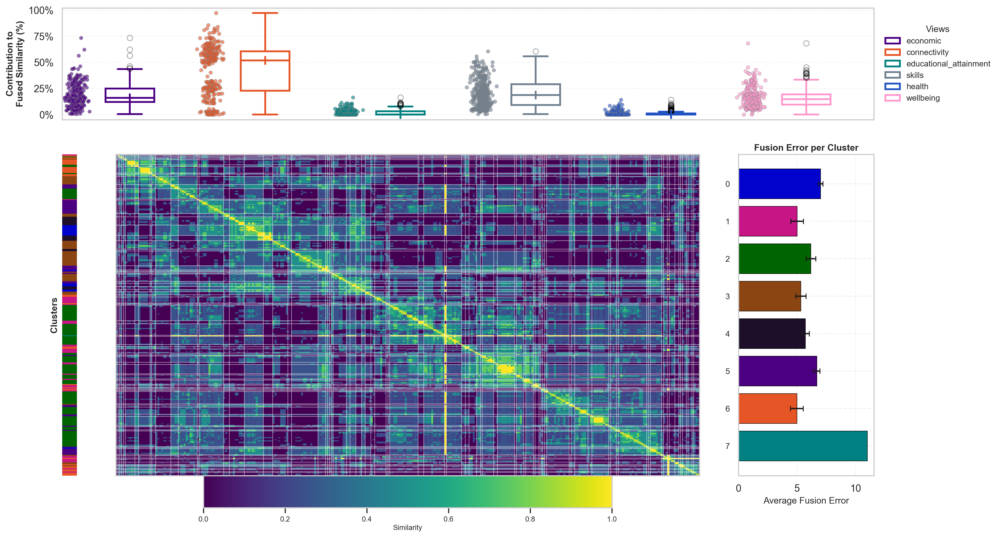

In [116]:
import numpy as np
from diagnostics_reports import plot_fusion_report, _compute_contributions_from_Slist  # contrib helper

# Build per-view similarity matrices (n×n) from per-view label vectors (−1 = missing)
labels_per_view = AECC_out["clusterings"]
view_names = list(labels_per_view.keys())

def sim_from_labels(labels, missing=-1):
    lab = np.asarray(labels)
    n = lab.shape[0]
    S = np.zeros((n, n), float)
    valid = lab != missing
    idx = np.where(valid)[0]
    if idx.size:
        same = (lab[idx, None] == lab[None, idx]).astype(float)  # 1 if same cluster
        S[np.ix_(idx, idx)] = same
    S = 0.5 * (S + S.T)
    np.fill_diagonal(S, 1.0)
    return S

S_list = [sim_from_labels(labels_per_view[vn]) for vn in view_names]

# Use AECC’s co-association as the “fused” matrix
S_fused = AECC_out["S_coassoc"]

# Derive per-LA, per-view contributions (row-normalized to sum to 1)
C = _compute_contributions_from_Slist(S_list, S_fused)  # (n × V), rows sum to 1

# Build a fusion-like dict and plot
fusion_like = dict(
    S_fused=S_fused,
    area_codes=AECC_out["area_codes"],
    similarity_matrices=S_list,
    labels=AECC_out["labels"],
    per_view_contributions_per_la=C,
    view_names=view_names,
)

fig = plot_fusion_report(
    method_out=fusion_like,
    views_custom_hex_palette=views_palette,
    clusters_custom_hex_palette=clusters_palette,
    linkage_method="average",
    normalize_contrib=True,
    cluster_order="numeric",
    savepath=r".\Pictures\AECC_Fusion_report.png",
)

# Comparative Analysis with ONS

In [ ]:
# Load ONS file
ONS_clusters_df = pd.read_csv(r"..\Datasets\Final Datasets\clusters_df.csv").set_index("Local_Authority_Code")

In [166]:
import numpy as np
import pandas as pd
from sklearn.metrics import normalized_mutual_info_score, adjusted_rand_score

def _as_series(labels, area_codes=None, name="labels") -> pd.Series:
    """Normalize to a Series indexed by area codes (as strings)."""
    if isinstance(labels, pd.Series):
        s = labels.copy()
        s.index = s.index.astype(str)
        s.name = name
        return s
    if area_codes is None:
        raise ValueError("If labels is not a Series, provide area_codes.")
    return pd.Series(labels, index=pd.Index(map(str, area_codes), name="Area Code"), name=name)

def _pair_align(s1: pd.Series, s2: pd.Series, invalid_pred = {-1, None, "None"}) -> tuple[np.ndarray, np.ndarray, int]:
    """Align two series and drop NaNs / invalid preds. Returns (y1, y2, n_used)."""
    idx = s1.index.intersection(s2.index)
    a, b = s1.loc[idx], s2.loc[idx]
    mask = a.notna() & b.notna()
    if invalid_pred:
        mask &= ~b.isin(invalid_pred) & ~a.isin(invalid_pred)
    a, b = a[mask], b[mask]
    return a.to_numpy(), b.to_numpy(), len(a)

def pairwise_cluster_agreement(
    methods: dict[str, pd.Series | tuple[np.ndarray, list]],
    *,
    nmi_average_method: str = "arithmetic",
    invalid_pred = {-1, None, "None"},
):
    """
    Build symmetric NMI/ARI matrices across all provided label sets.

    Parameters
    ----------
    methods : dict[name -> Series OR (labels, area_codes)]
        All entries will be aligned pairwise on intersection of area codes.
    nmi_average_method : str
        'arithmetic'|'geometric'|'min'|'max' (sklearn NMI option).
    invalid_pred : set
        Values to drop before scoring (e.g., -1 for “unassigned”).

    Returns
    -------
    nmi_df, ari_df, n_df : pd.DataFrame
        Symmetric DataFrames of NMI, ARI, and the # of items used per pair.
    """
    # Normalize everything to Series with string index
    series = {}
    for name, obj in methods.items():
        if isinstance(obj, pd.Series):
            series[name] = _as_series(obj, name=name)
        else:
            labels, area_codes = obj
            series[name] = _as_series(labels, area_codes, name=name)

    names = list(series.keys())
    m = len(names)
    nmi = np.full((m, m), np.nan, float)
    ari = np.full((m, m), np.nan, float)
    n_used = np.zeros((m, m), int)

    for i in range(m):
        nmi[i, i] = 1.0
        ari[i, i] = 1.0
        n_used[i, i] = series[names[i]].notna().sum()
        for j in range(i + 1, m):
            y1, y2, n = _pair_align(series[names[i]], series[names[j]], invalid_pred=invalid_pred)
            n_used[i, j] = n_used[j, i] = n
            if n > 0:
                nmi_ij = normalized_mutual_info_score(y1, y2, average_method=nmi_average_method)
                ari_ij = adjusted_rand_score(y1, y2)
                nmi[i, j] = nmi[j, i] = nmi_ij
                ari[i, j] = ari[j, i] = ari_ij

    idx = pd.Index(names, name="Method")
    nmi_df = pd.DataFrame(nmi, index=idx, columns=idx)
    ari_df = pd.DataFrame(ari, index=idx, columns=idx)
    n_df   = pd.DataFrame(n_used, index=idx, columns=idx)
    return nmi_df, ari_df, n_df


Method,ONS_Headline,MCS,MVSF,CSE,MNMF,PVNMF,CFE,MA,MBASB,AECC
Method,,,,,,,,,,
ONS_Headline,1.000000,0.218960,0.231393,0.210416,0.051355,0.039597,0.198093,0.126360,0.126112,0.225453
MCS,0.218960,1.000000,0.098840,0.198843,0.030271,0.016885,0.078615,0.031003,0.035066,0.117824
MVSF,0.231393,0.098840,1.000000,0.100687,0.052708,0.034227,0.101957,0.035902,0.037366,0.098199
CSE,0.210416,0.198843,0.100687,1.000000,0.097764,0.055133,0.167057,0.059335,0.060065,0.227212
MNMF,0.051355,0.030271,0.052708,0.097764,1.000000,0.040387,0.119978,0.042133,0.046354,0.067901
PVNMF,0.039597,0.016885,0.034227,0.055133,0.040387,1.000000,0.452775,0.042605,0.044135,0.072802
CFE,0.198093,0.078615,0.101957,0.167057,0.119978,0.452775,1.000000,0.103194,0.107694,0.187619
MA,0.126360,0.031003,0.035902,0.059335,0.042133,0.042605,0.103194,1.000000,0.918001,0.148792
MBASB,0.126112,0.035066,0.037366,0.060065,0.046354,0.044135,0.107694,0.918001,1.000000,0.145207


Method,ONS_Headline,MCS,MVSF,CSE,MNMF,PVNMF,CFE,MA,MBASB,AECC
Method,,,,,,,,,,
ONS_Headline,1.000000,0.168541,0.221180,0.095341,0.004677,0.027495,0.069081,0.055925,0.050922,0.116104
MCS,0.168541,1.000000,0.115197,0.080224,-0.004911,-0.001610,0.010495,-0.048608,-0.050566,0.031787
MVSF,0.221180,0.115197,1.000000,0.016501,0.006785,-0.019920,-0.003849,-0.069485,-0.072051,-0.012103
CSE,0.095341,0.080224,0.016501,1.000000,-0.010154,0.014401,0.025405,0.012085,0.011438,0.102550
MNMF,0.004677,-0.004911,0.006785,-0.010154,1.000000,0.003703,0.004181,0.009680,0.010799,-0.003960
PVNMF,0.027495,-0.001610,-0.019920,0.014401,0.003703,1.000000,0.260715,0.027800,0.029640,0.050015
CFE,0.069081,0.010495,-0.003849,0.025405,0.004181,0.260715,1.000000,0.037667,0.037872,0.126818
MA,0.055925,-0.048608,-0.069485,0.012085,0.009680,0.027800,0.037667,1.000000,0.955699,0.108482
MBASB,0.050922,-0.050566,-0.072051,0.011438,0.010799,0.029640,0.037872,0.955699,1.000000,0.105257


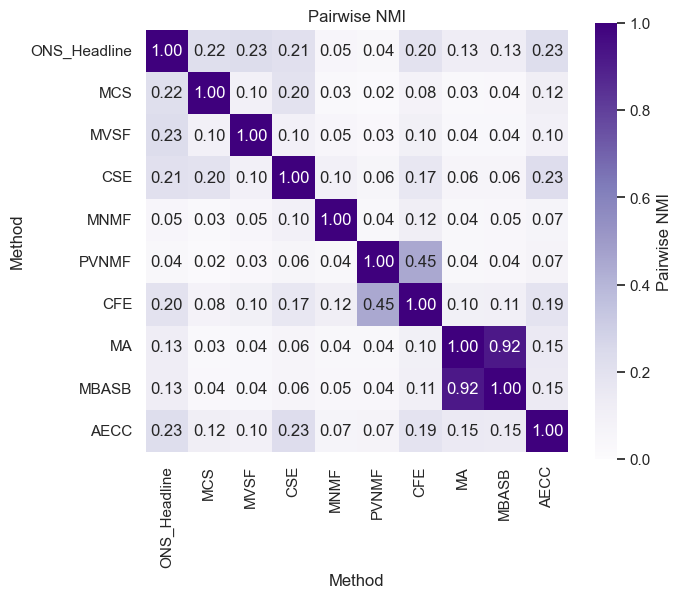

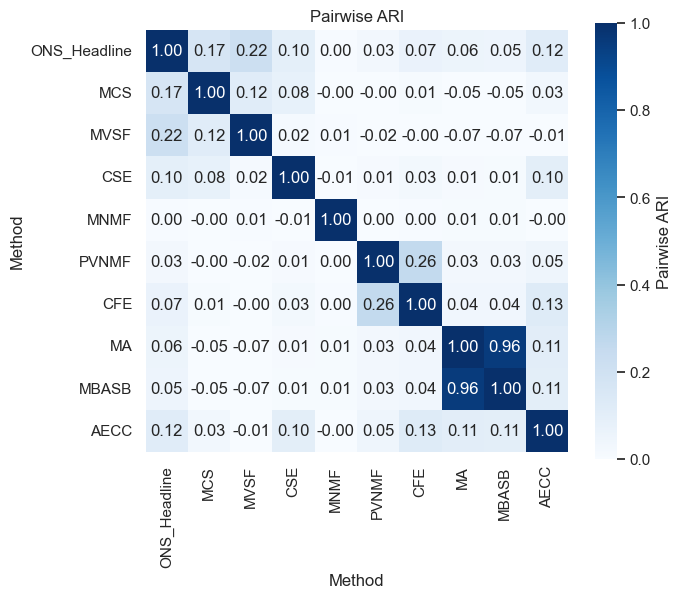

In [168]:
# ONS headline labels as a Series
ons_series = ONS_clusters_df['Headline Model'].copy()
ons_series.index = ons_series.index.astype(str)
ons_series.name = "ONS_Headline"

# Collect your method labels (Series or (labels, area_codes))
methods = {
    "ONS_Headline": ons_series,
    "MCS": (MCS_labels,  MCS_out["area_codes"]),
    "MVSF": (MVSF_labels,  MVSF_out["area_codes"]),
    "CSE": (CSE_labels,   CSE_out["area_codes"]),
    "MNMF": (MNMF_labels,  MNMF_out["area_codes"]),
    "PVNMF":(PVNMF_labels, PVNMF_out["area_codes"]),
    "CFE": (CFE_labels,   CFE_out["area_codes"]),
    "MA": (MA_labels,  MA_out["area_codes"]),
    "MBASB": (MBASB_labels, MBASB_out["area_codes"]),
    "AECC": (AECC_labels,  AECC_out["area_codes"]),
    
}

# Build symmetric matrices
nmi_df, ari_df, n_df = pairwise_cluster_agreement(
    methods,
    nmi_average_method="arithmetic",
    invalid_pred={-1, None, "None"},
)

display(nmi_df)
display(ari_df)

import seaborn as sns
import matplotlib.pyplot as plt

def heatmap(df, title, palette, vmin=0, vmax=1):
    plt.figure(figsize=(7, 6))
    sns.heatmap(df, annot=True, fmt=".2f", vmin=vmin, vmax=vmax, cmap=palette, square=True, cbar_kws={'label': title})
    plt.title(title); plt.tight_layout(); plt.show()

heatmap(nmi_df, "Pairwise NMI", palette="Purples")
heatmap(ari_df, "Pairwise ARI", palette="Blues")
